In [1]:
import gzip
import pickle
import itertools
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as tt
import arviz as az
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error

from utils import standardize_data, get_geodata, plot_geodata_world, world_error_plot

az.style.use('arviz-whitegrid')

In [2]:
# The dictionary containing results
results = dict()

# Utilities

## Useful Functions

In [3]:
def compute_mae(pred_values, true_values):
    # Compute the median of predictions
    pred_meds = np.median(pred_values.reshape(-1, len(true_values)), axis=0)
    return mean_absolute_error(true_values, pred_meds)

In [4]:
def compute_average_ll(trace):
    ll = trace.log_likelihood.to_array()
    mu_ll = ll.mean(axis=(0, 1))
    sigma_ll = 2.0 * ll.std(axis=(0, 1))
    return mu_ll.mean().item(), sigma_ll.mean().item()

In [5]:
def error_hdi50(pred_values, true_val):
    # Return whether the true value is out of the 50% HDI interval (and "how much") and its center
    q1, q2 = np.quantile(pred_values, [0.25, 0.75])
    qm = 0.5 * (q2 + q1)
    return (true_val < q1) or (true_val > q2), np.abs(true_val - qm)

## Useful Plotting Functions

In [6]:
def plot_weights_relevance(trace, features, var_name='beta', max_num=None, xlim=(-1, 1)):
    beta_dict = {k: trace.posterior[var_name][..., i] for i, k in enumerate(features)}
    beta_dict = {k: v for k, v in sorted(beta_dict.items(), key=lambda x: np.abs(np.median(x[1])), reverse=True)}
    if max_num is not None:
        assert max_num > 0
        beta_dict = {k: v for i, (k, v) in enumerate(beta_dict.items()) if i < max_num}
    axes = az.plot_forest(beta_dict, quartiles=True, combined=True, figsize=(8, 4))
    axes[0].set_xlim(xlim)
    axes[0].set_title('Posterior Feature Weights Distributions')
    plt.plot()

In [7]:
def plot_predictions(
    y_pred_trace, y_true, indices=None, sample_ids=None, transform=None,
    xlim=None, title=None, ax=None, figsize=(7, 6), show=True
):
    if indices is None:
        indices = np.arange(len(y_true))
    if sample_ids is None:
        sample_ids = np.arange(len(y_true))
    preds = {sample_ids[i]: y_pred_trace[:, i] for i in indices}
    trues = {sample_ids[i]: y_true[i] for i in indices}
    var_names = sample_ids[indices]
    if ax is not None:
        figsize = None
        show = False
    axes = az.plot_forest(
        [preds, trues], model_names=['Prediction', 'True'], var_names=var_names,
        transform=transform, quartiles=True, combined=True, colors=['C0', 'C3'], ax=ax, figsize=figsize
    )
    if xlim is not None:
        axes[0].set_xlim(xlim)
    if title is not None:
        axes[0].set_title(title)
    if show:
        plt.plot()

In [8]:
def plot_relevant_predictions(
    y_pred_trace, y_true, err_descending=True, max_num=10,
    sample_ids=None, transform=None, xlim=None, title=None, figsize=(7, 6)
):
    err50_infos = [error_hdi50(y_pred_trace[:, i], y_true[i]) for i in range(len(countries))]
    err50_indices = [i for i, _ in sorted(enumerate(err50_infos), key=lambda x: x[1][1], reverse=err_descending)]
    err50_indices = err50_indices[:max_num]
    plot_predictions(
        y_pred_trace, y_data, err50_indices, sample_ids=sample_ids, transform=transform,
        xlim=xlim, figsize=figsize, title=title
    )
    plt.plot()
    return err50_indices

In [9]:
def plot_predictions_compare(y_pred_trace1, y_pred_trace2, y_true, indices=None, sample_ids=None, transform=None,
    xlim=None, titles=None, figsize=(15, 6)
):
    if titles is None:
        titles = (None, None)
    fig, ax = plt.subplots(1, 2, figsize=figsize, sharex=True, sharey=True)
    plot_predictions(y_pred_trace1, y_true, indices=indices, sample_ids=sample_ids, transform=transform, xlim=xlim, title=titles[0], ax=ax[0])
    plot_predictions(y_pred_trace2, y_true, indices=indices, sample_ids=sample_ids, transform=transform, xlim=xlim, title=titles[1], ax=ax[1])
    plt.plot()

# Countries Crop Yield Regression

## The Dataset

In [10]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)
cy

,Area,Item,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
0,Albania,Potatoes,153105.043478,1485.0,2.184838,16.326957,41.0,20.0,708.0
1,Albania,Wheat,31575.347826,1485.0,2.184838,16.326957,41.0,20.0,708.0
2,Algeria,Potatoes,182413.956522,89.0,1.110530,17.488261,28.0,3.0,800.0
3,Algeria,Wheat,12009.913043,89.0,1.110530,17.488261,28.0,3.0,800.0
4,Angola,Potatoes,59085.739130,1010.0,0.027360,24.303043,-12.5,18.5,1112.0
...,...,...,...,...,...,...,...,...,...
172,Uruguay,Wheat,24845.478261,1300.0,6.608791,16.980870,-33.0,-56.0,109.0
173,Zambia,Potatoes,115800.652174,1020.0,1.066569,21.064783,-15.0,30.0,1138.0
174,Zambia,Wheat,59848.347826,1020.0,1.066569,21.064783,-15.0,30.0,1138.0
175,Zimbabwe,Potatoes,160965.434783,657.0,1.162260,20.831739,-20.0,30.0,961.0


### Potatoes Yield

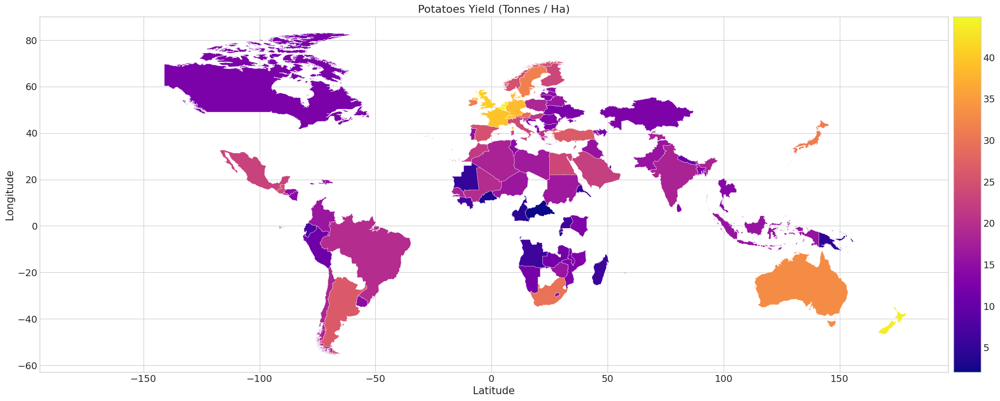

In [11]:
# Select Potatoes as item and remove country name feature
cyp = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
countries = cyp['Area'].unique()
cyp = cyp.drop('Area', axis=1)

# Plot the yield per country
plot_geodata_world(countries, cyp['hg/ha_yield'] * 1e-4, title='Potatoes Yield (Tonnes / Ha)')

### Features Standardization

In [12]:
# Get the features and the target feature
x_data = cyp.drop('hg/ha_yield', axis=1)
y_data = cyp['hg/ha_yield']
cyp.describe()

,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
count,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000
mean,181841.413334,1019.326316,3.143013,17.850083,21.398688,15.279380,637.568421
std,96668.731420,696.800613,4.049940,7.388661,27.141268,54.357624,586.573509
min,20516.217391,51.000000,0.003028,3.459565,-41.000000,-102.000000,28.000000
25%,127517.738095,577.000000,0.217843,10.646667,2.500000,-3.000000,297.500000
50%,160965.434783,788.000000,1.590888,18.163478,25.000000,20.000000,460.000000
75%,224914.108696,1492.500000,4.085821,24.843652,44.083333,35.416667,826.500000
max,448891.538462,3240.000000,20.888427,29.718696,64.000000,174.000000,3265.000000


In [13]:
# Set random seed
np.random.seed(42)

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Set the indices of the samples that will be used for evaluation
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)

## Exact Evaluation Metrics

Exact predictions can be obtained by computing the median of the predictions given by using the posterior distribution.
Let $y$ be the true target value and $\hat{y}$ its estimation.
The Mean Average Error ($\mathrm{MAE}$) is defined as follows.

$$\mathrm{MAE}(y, \hat{y}) = \frac{1}{n} \sum_{i=1}^n \left| y_i - \hat{y}_i \right| \in [0, +\infty)$$

# Linear Regression

In [14]:
def pymc3_linear_regression_model(
    x_data, y_data,
    eps_scale=3.0,
    alpha_mu=0.0, alpha_sd=5.0,
    beta_mu=0.0, beta_sd=5.0
):
    # Build a PyMC3 linear regression model
    with pm.Model() as model:
        # Intercept and slope priors
        alpha = pm.Normal('alpha', mu=alpha_mu, sd=alpha_sd)
        beta = pm.Normal('beta', mu=beta_mu, sd=beta_sd, shape=x_data.shape[1])

        # Fixed noise prior
        eps = pm.HalfCauchy('eps', eps_scale)

        # Likelihood
        mu = pm.Deterministic('mu', alpha + tt.dot(x_data, beta))
        y_pred = pm.Normal('y_pred', mu=mu, sd=eps, observed=y_data)
        return model

In [15]:
def pymc3_sample_predictions(model, trace, target_var='y_pred'):
    # Sample the predictions
    with model:
        ppc = pm.fast_sample_posterior_predictive(trace)
        pred_samples = ppc[target_var]
        return ppc, pred_samples

In [16]:
# Build a PyMC3 model for linear regression
model = pymc3_linear_regression_model(x_std_data, y_std_data)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=20_000, tune=10_000,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [eps, beta, alpha]


Sampling 3 chains for 10_000 tune and 20_000 draw iterations (30_000 + 60_000 draws total) took 29 seconds.


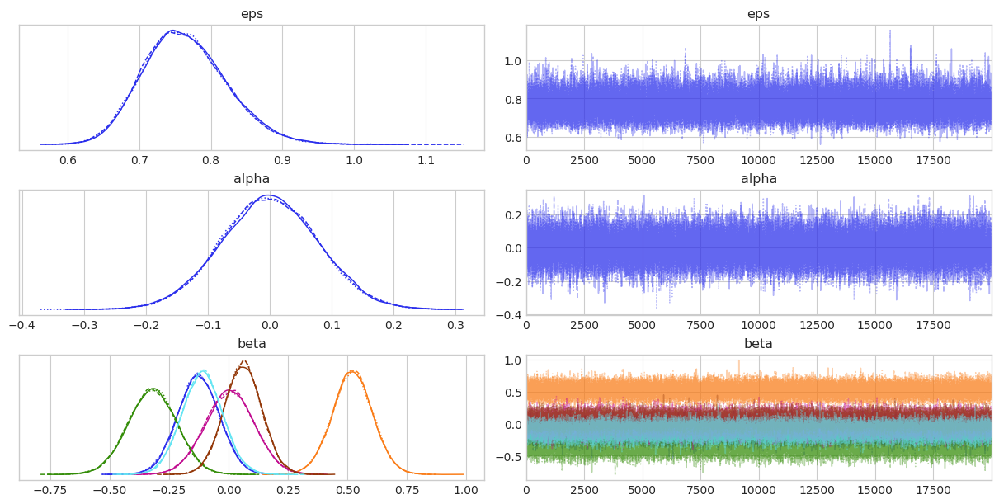

In [17]:
# Plot traces
az.plot_trace(trace, var_names=['eps', 'alpha', 'beta'])
plt.show()

[]

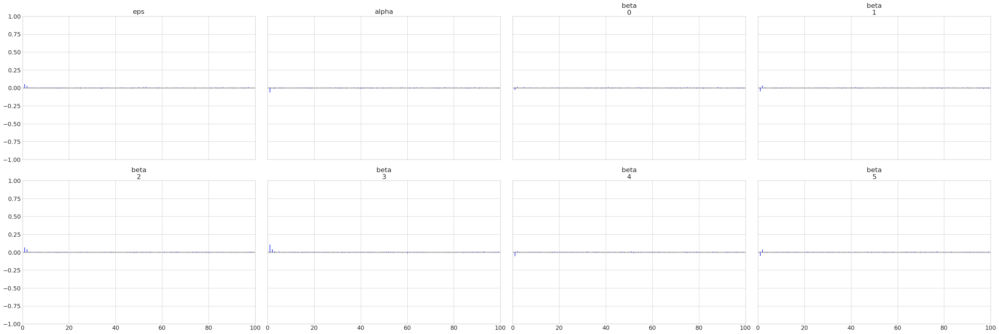

In [18]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['eps', 'alpha', 'beta'], combined=True)
plt.plot()

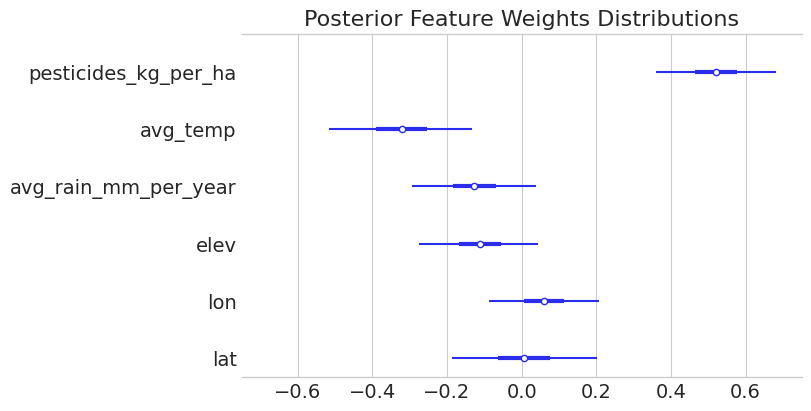

In [19]:
# Plot posterior feature weights distributions
plot_weights_relevance(trace, x_std_data.columns, xlim=(-0.75, 0.75))

Based on linear regression, the most useful features for the predictions are the usage of pesticides, the average temperature, the average ground elevation and the quantity of rain per year of the country.
The contribution to the predictions of longitude and latitude of the countries is negligible.

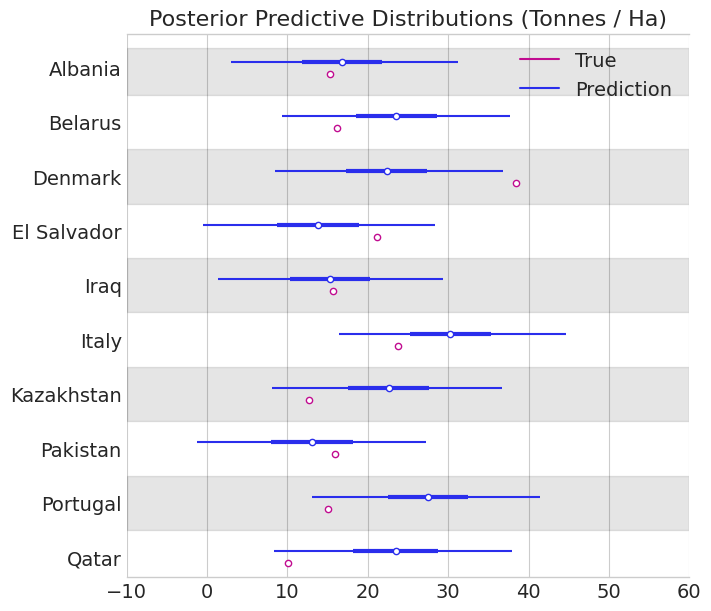

In [20]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

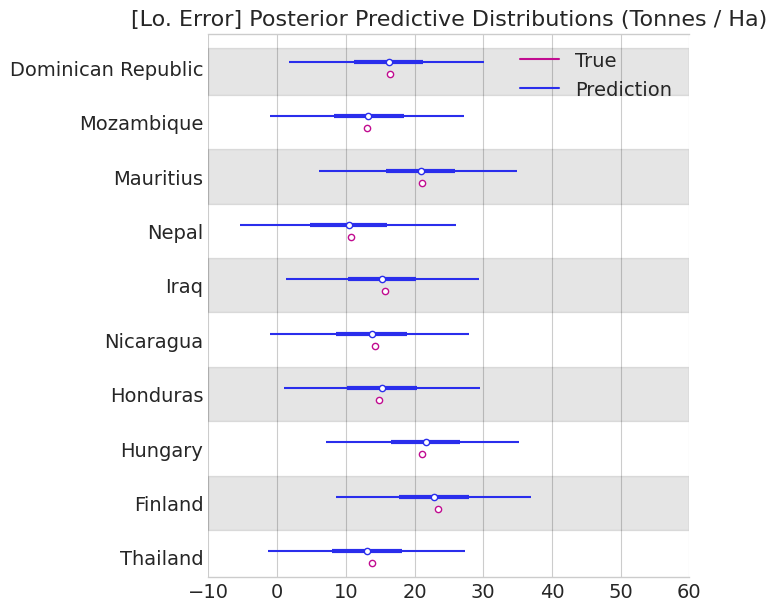

In [21]:
# Sort the predictions by taking the countries having smallest error
lo_err_indices = plot_relevant_predictions(
    pred_samples, y_data, err_descending=False, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Lo. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

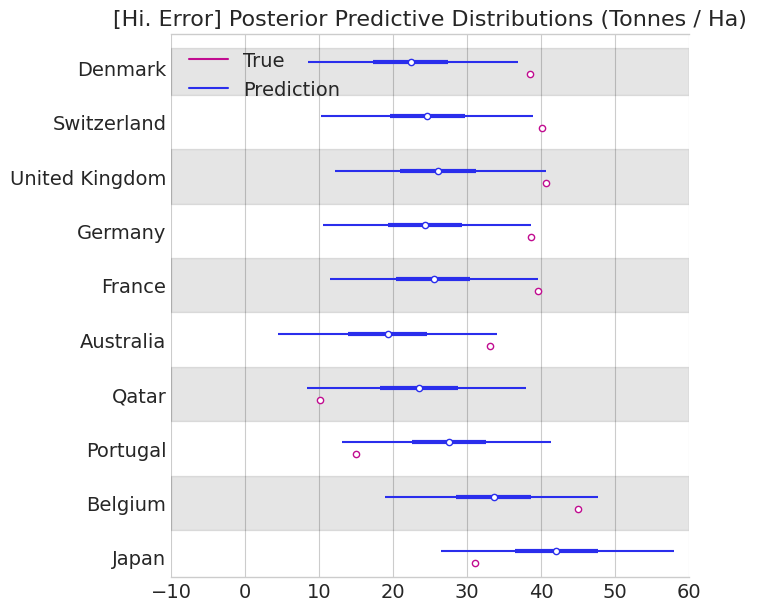

In [22]:
# Sort the predictions by taking the countries having highest error
hi_err_indices = plot_relevant_predictions(
    pred_samples, y_data, err_descending=True, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Hi. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

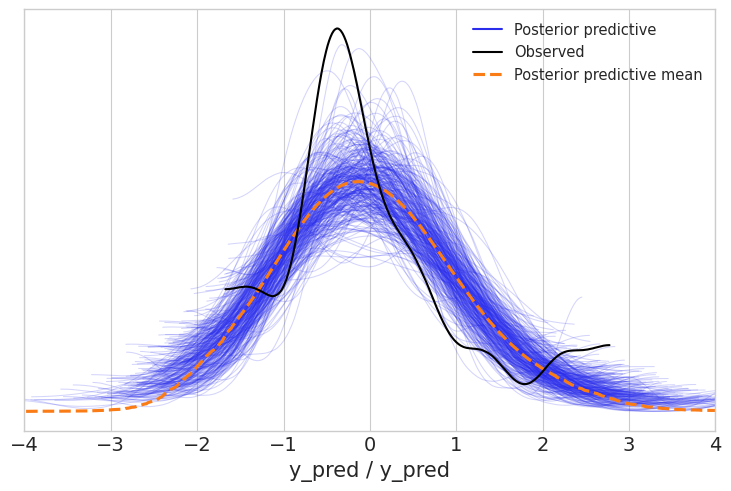

In [23]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [24]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Multivariate Linear Regression:")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Multivariate Linear Regression:
Avg. LL: -1.14 +- 0.33


In [25]:
# Print MAE
mae = compute_mae(pred_samples, y_data)
print("Multivariate Linear Regression:")
print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))

Multivariate Linear Regression:
MAE: 5.76 (Tonnes / Ha)


In [26]:
# Save results
results['linear'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': (lo_err_indices, hi_err_indices)
}

# Polynomial Regression

In [27]:
def design_matrix_polynomial(df, n, interaction_only=False):
    assert 0 < n <= df.shape[1]

    # n=1: just return the input data
    if n == 1:
        return df

    # n>1: compute all the combinations (with our without replacement)
    columns = {i: c for i, c in enumerate(df.columns)}
    if interaction_only:
        combinations = list(itertools.combinations(range(len(columns)), n))
    else:
        combinations = list(itertools.combinations_with_replacement(range(len(columns)), n))

    def build_header_features(features):
        fs, cs = np.unique(features, return_counts=True)
        return '*'.join([
            columns[i] if j == 1 else '{}^{}'.format(columns[i], j)
            for i, j in zip(fs, cs)
        ])

    # Multiply features and also headers
    dm = np.array([
        np.product([df[columns[i]] for i in features], axis=0)
        for features in combinations
    ]).T
    header = [build_header_features(features) for features in combinations]

    # Concatenate design matrices recursively
    dm = pd.DataFrame(dm, columns=header)
    return pd.concat([design_matrix_polynomial(df, n - 1, interaction_only=interaction_only), dm], axis=1)

We define the method `design_matrix_polynomial` that computes the corresponding polynomial design matrix of a given grade.
Moreover, with `interaction_only=True` we can exclude resulting features computed using powers of a single feature.

In [28]:
df = pd.DataFrame({'X': [0.3, 0.5, -1.0, 0.2], 'Y': [0.5, 1.0, 1.0, 0.5], 'Z': [2.0, -0.8, 0.7, -0.1]})
display(df)
display(design_matrix_polynomial(df, n=2))
display(design_matrix_polynomial(df, n=2, interaction_only=True))

,X,Y,Z
0,0.3,0.5,2.0
1,0.5,1.0,-0.8
2,-1.0,1.0,0.7
3,0.2,0.5,-0.1


,X,Y,Z,X^2,X*Y,X*Z,Y^2,Y*Z,Z^2
0,0.3,0.5,2.0,0.09,0.15,0.60,0.25,1.00,4.00
1,0.5,1.0,-0.8,0.25,0.50,-0.40,1.00,-0.80,0.64
2,-1.0,1.0,0.7,1.00,-1.00,-0.70,1.00,0.70,0.49
3,0.2,0.5,-0.1,0.04,0.10,-0.02,0.25,-0.05,0.01


,X,Y,Z,X*Y,X*Z,Y*Z
0,0.3,0.5,2.0,0.15,0.60,1.00
1,0.5,1.0,-0.8,0.50,-0.40,-0.80
2,-1.0,1.0,0.7,-1.00,-0.70,0.70
3,0.2,0.5,-0.1,0.10,-0.02,-0.05


## Full Quadratic Regression

In [29]:
# Build design matrix for polynomial regression with grade 2
features = ['pesticides_kg_per_ha', 'avg_temp', 'elev', 'avg_rain_mm_per_year']
p_dataset = design_matrix_polynomial(x_data[features], n=2)

# Standardize the data
p_dataset, p_mean, p_stddev = standardize_data(p_dataset)
p_dataset.describe()

,pesticides_kg_per_ha,avg_temp,elev,avg_rain_mm_per_year,pesticides_kg_per_ha^2,pesticides_kg_per_ha*avg_temp,pesticides_kg_per_ha*elev,pesticides_kg_per_ha*avg_rain_mm_per_year,avg_temp^2,avg_temp*elev,avg_temp*avg_rain_mm_per_year,elev^2,elev*avg_rain_mm_per_year,avg_rain_mm_per_year^2
count,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01
mean,-4.090295e-18,1.110223e-16,-3.856564e-17,-2.571043e-17,-5.901712e-17,-5.843279e-19,1.679943e-16,7.187233e-17,-3.783523e-16,-1.659491e-16,7.713128e-17,1.007966e-17,1.877153e-17,4.440892e-17
std,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00
min,-7.794295e-01,-1.957981e+00,-1.044715e+00,-1.397047e+00,-4.074095e-01,-7.475924e-01,-6.040307e-01,-5.524163e-01,-1.399833e+00,-1.174473e+00,-9.739432e-01,-4.574500e-01,-8.550837e-01,-7.687729e-01
25%,-7.261067e-01,-9.801006e-01,-5.828298e-01,-6.381637e-01,-4.066677e-01,-6.753082e-01,-5.633282e-01,-5.222205e-01,-1.006351e+00,-7.864306e-01,-7.352445e-01,-4.036695e-01,-7.068100e-01,-6.012819e-01
50%,-3.852796e-01,4.264066e-02,-3.043275e-01,-3.337447e-01,-3.679150e-01,-4.538798e-01,-4.182575e-01,-4.369116e-01,-1.658463e-01,-2.304064e-01,-4.156088e-01,-3.282039e-01,-3.231122e-01,-4.553821e-01
75%,2.340307e-01,9.515486e-01,3.238023e-01,6.826686e-01,-1.468989e-01,3.014929e-01,1.543385e-01,1.175884e-01,9.492200e-01,5.917745e-01,4.242161e-01,-3.870694e-02,2.230270e-01,3.589152e-01
max,4.404894e+00,1.614850e+00,4.503051e+00,3.203864e+00,6.401398e+00,4.139688e+00,6.359600e+00,5.588190e+00,1.981553e+00,4.212664e+00,3.218028e+00,6.077591e+00,5.379781e+00,4.550339e+00


In [30]:
# Build a PyMC3 model for linear regression
model = pymc3_linear_regression_model(p_dataset, y_std_data)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=60_000, tune=30_000, target_accept=0.9,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [eps, beta, alpha]


Sampling 3 chains for 30_000 tune and 60_000 draw iterations (90_000 + 180_000 draws total) took 512 seconds.


[]

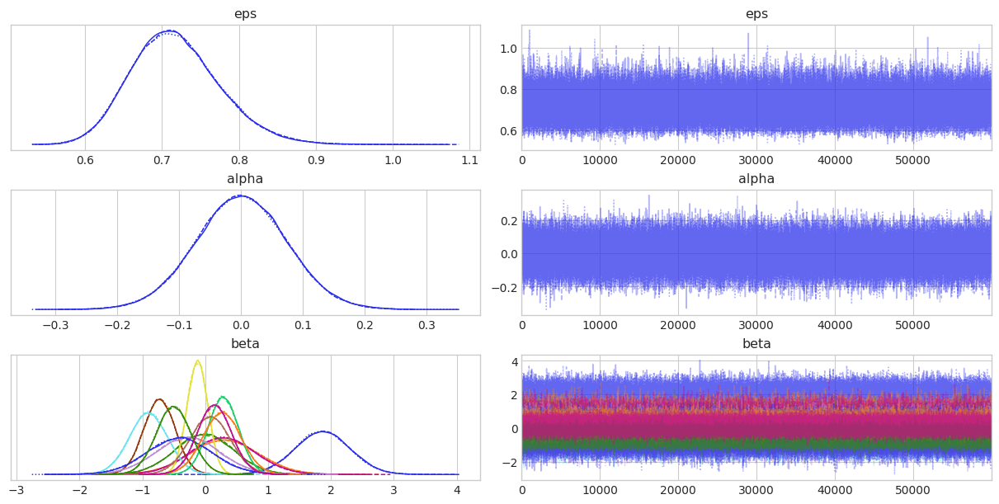

In [31]:
# Plot traces
az.plot_trace(trace, var_names=['eps', 'alpha', 'beta'])
plt.plot()

[]

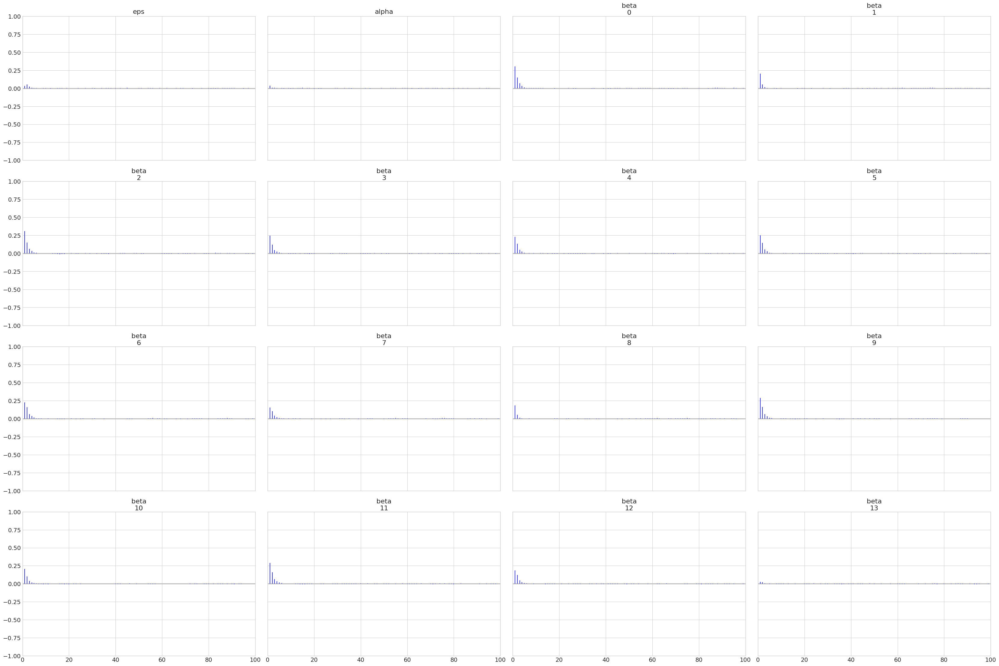

In [32]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['eps', 'alpha', 'beta'], combined=True)
plt.plot()

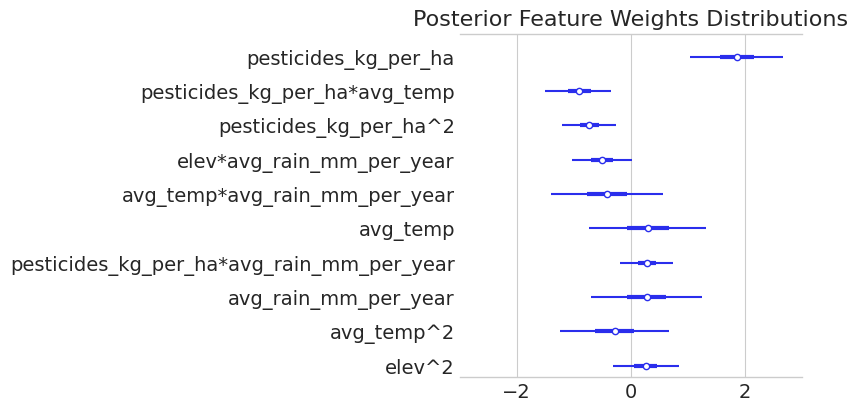

In [33]:
# Plot posterior feature weights distributions
plot_weights_relevance(trace, p_dataset.columns, max_num=10, xlim=(-3, 3))

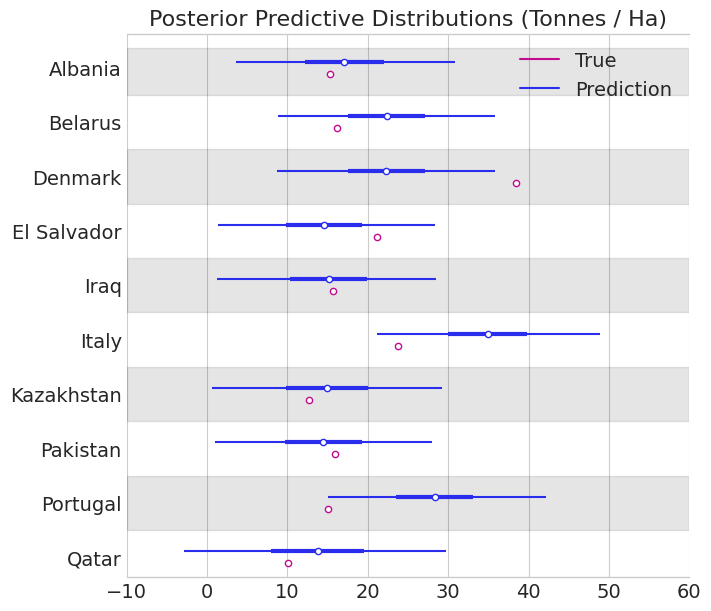

In [34]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

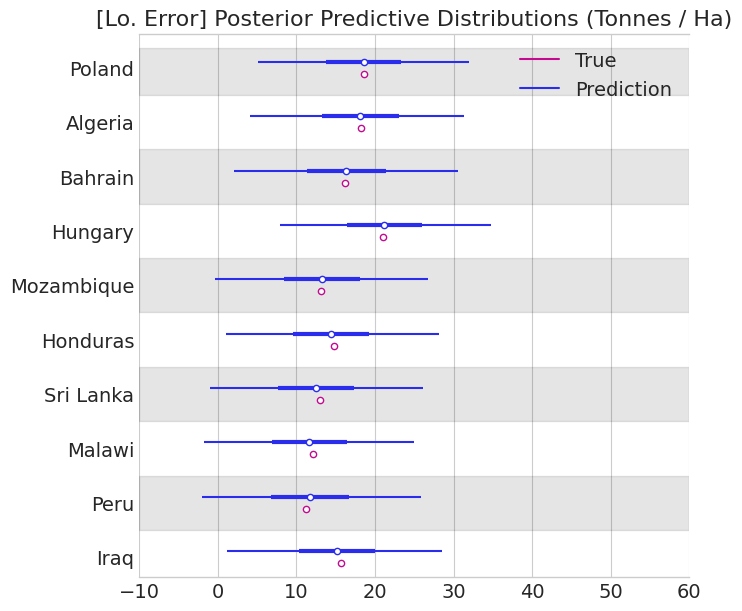

In [35]:
# Sort the predictions by taking the countries having lowest error
lo_err_indices = plot_relevant_predictions(
    pred_samples, y_data, err_descending=False, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Lo. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

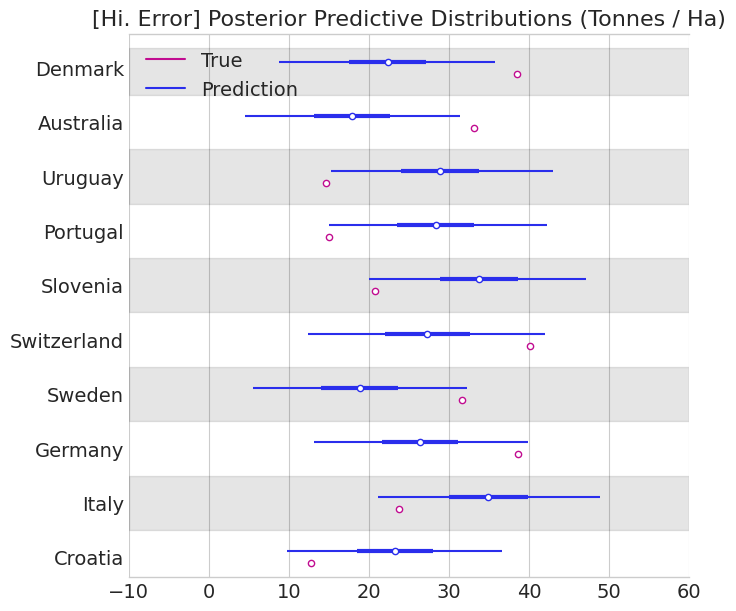

In [36]:
# Sort the predictions by taking the countries having highest error
hi_err_indices = plot_relevant_predictions(
    pred_samples, y_data, err_descending=True, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Hi. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

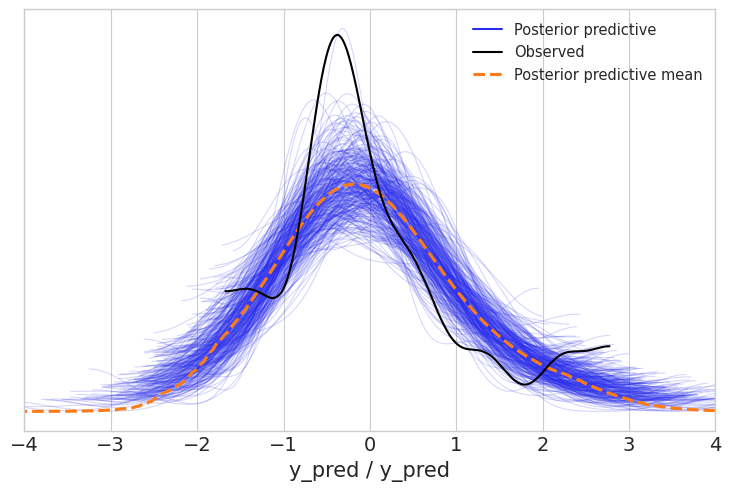

In [37]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [38]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Quadratic Regression:")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Quadratic Regression:
Avg. LL: -1.08 +- 0.42


In [39]:
# Print MAE
mae = compute_mae(pred_samples, y_data)
print("Quadratic Regression:")
print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))

Quadratic Regression:
MAE: 4.88 (Tonnes / Ha)


In [40]:
# Save results
results['quadratic'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': (lo_err_indices, hi_err_indices)
}

### Comparison

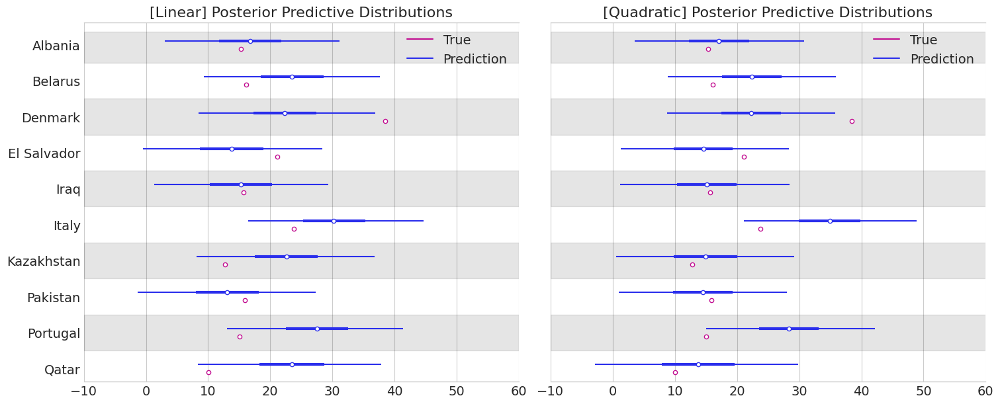

In [41]:
# Plot comparison of predictions
plot_predictions_compare(
    results['linear']['pred_samples'], results['quadratic']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Linear] Posterior Predictive Distributions', '[Quadratic] Posterior Predictive Distributions')
)

[]

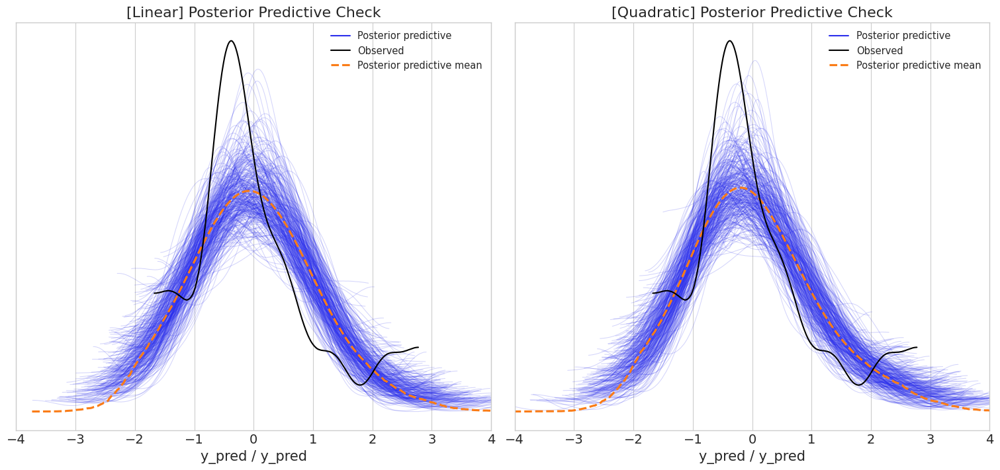

In [42]:
# Posterior predictive check comparison
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
az.plot_ppc(results['linear']['ppc_data'], num_pp_samples=320, ax=ax[0])
az.plot_ppc(results['quadratic']['ppc_data'], num_pp_samples=320, ax=ax[1])
ax[0].set_xlim((-4, 4)); ax[1].set_xlim((-4, 4))
ax[0].set_title('[Linear] Posterior Predictive Check'); ax[1].set_title('[Quadratic] Posterior Predictive Check')
plt.plot()

## Cubic Regression (with Simple Interactions)

In [43]:
# Build design matrix for polynomial regression with grade 3 with simple interactions
features = ['pesticides_kg_per_ha', 'avg_temp', 'elev', 'avg_rain_mm_per_year']
p_dataset = design_matrix_polynomial(x_data[features], n=3, interaction_only=True)

# Standardize the data
p_dataset, p_mean, p_stddev = standardize_data(p_dataset)
p_dataset.describe()

,pesticides_kg_per_ha,avg_temp,elev,avg_rain_mm_per_year,pesticides_kg_per_ha*avg_temp,pesticides_kg_per_ha*elev,pesticides_kg_per_ha*avg_rain_mm_per_year,avg_temp*elev,avg_temp*avg_rain_mm_per_year,elev*avg_rain_mm_per_year,pesticides_kg_per_ha*avg_temp*elev,pesticides_kg_per_ha*avg_temp*avg_rain_mm_per_year,pesticides_kg_per_ha*elev*avg_rain_mm_per_year,avg_temp*elev*avg_rain_mm_per_year
count,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01
mean,-4.090295e-18,1.110223e-16,-3.856564e-17,-2.571043e-17,-5.843279e-19,1.679943e-16,7.187233e-17,-1.659491e-16,7.713128e-17,1.877153e-17,8.531187e-17,-4.791489e-17,-8.764919e-18,1.503914e-16
std,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00
min,-7.794295e-01,-1.957981e+00,-1.044715e+00,-1.397047e+00,-7.475924e-01,-6.040307e-01,-5.524163e-01,-1.174473e+00,-9.739432e-01,-8.550837e-01,-6.539887e-01,-4.695207e-01,-4.606051e-01,-8.656774e-01
25%,-7.261067e-01,-9.801006e-01,-5.828298e-01,-6.381637e-01,-6.753082e-01,-5.633282e-01,-5.222205e-01,-7.864306e-01,-7.352445e-01,-7.068100e-01,-6.105834e-01,-4.451607e-01,-4.470174e-01,-7.628199e-01
50%,-3.852796e-01,4.264066e-02,-3.043275e-01,-3.337447e-01,-4.538798e-01,-4.182575e-01,-4.369116e-01,-2.304064e-01,-4.156088e-01,-3.231122e-01,-4.700704e-01,-3.995741e-01,-3.989551e-01,-4.080065e-01
75%,2.340307e-01,9.515486e-01,3.238023e-01,6.826686e-01,3.014929e-01,1.543385e-01,1.175884e-01,5.917745e-01,4.242161e-01,2.230270e-01,8.056696e-02,3.940389e-02,-7.733351e-02,4.315422e-01
max,4.404894e+00,1.614850e+00,4.503051e+00,3.203864e+00,4.139688e+00,6.359600e+00,5.588190e+00,4.212664e+00,3.218028e+00,5.379781e+00,4.263242e+00,7.006240e+00,5.580990e+00,4.399037e+00


In [44]:
# Build a PyMC3 model for linear regression
model = pymc3_linear_regression_model(p_dataset, y_std_data)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=60_000, tune=30_000, target_accept=0.9,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [eps, beta, alpha]


Sampling 3 chains for 30_000 tune and 60_000 draw iterations (90_000 + 180_000 draws total) took 896 seconds.


[]

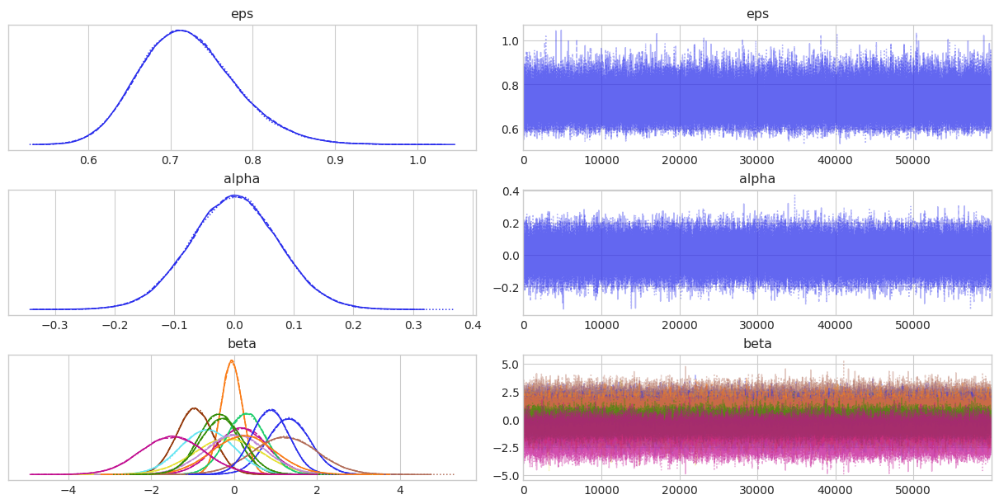

In [45]:
# Plot traces
az.plot_trace(trace, var_names=['eps', 'alpha', 'beta'])
plt.plot()

[]

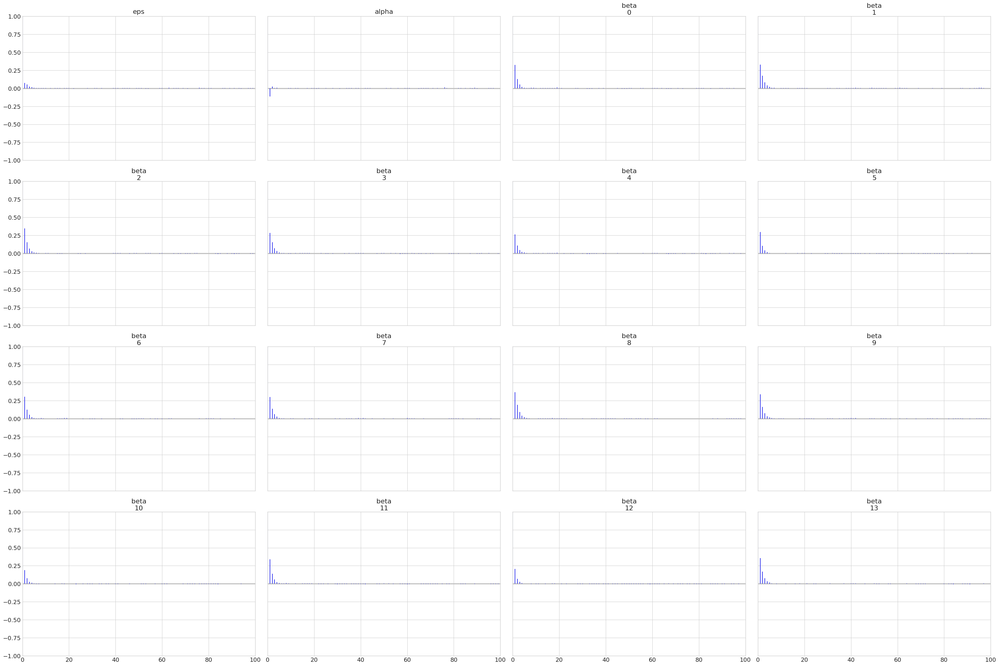

In [46]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['eps', 'alpha', 'beta'], combined=True)
plt.plot()

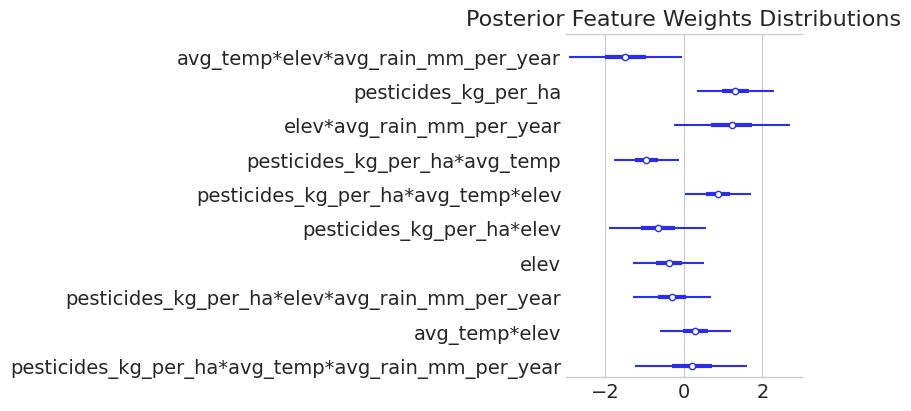

In [47]:
# Plot posterior feature weights distributions
plot_weights_relevance(trace, p_dataset.columns, max_num=10, xlim=(-3, 3))

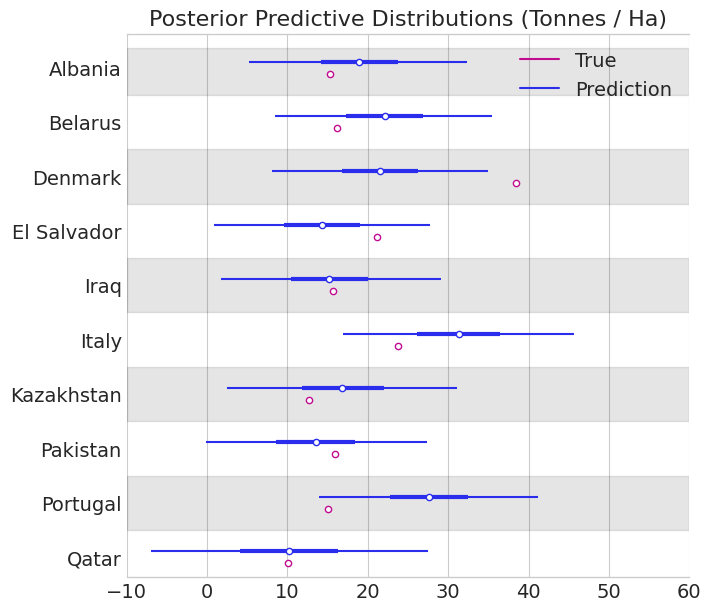

In [48]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

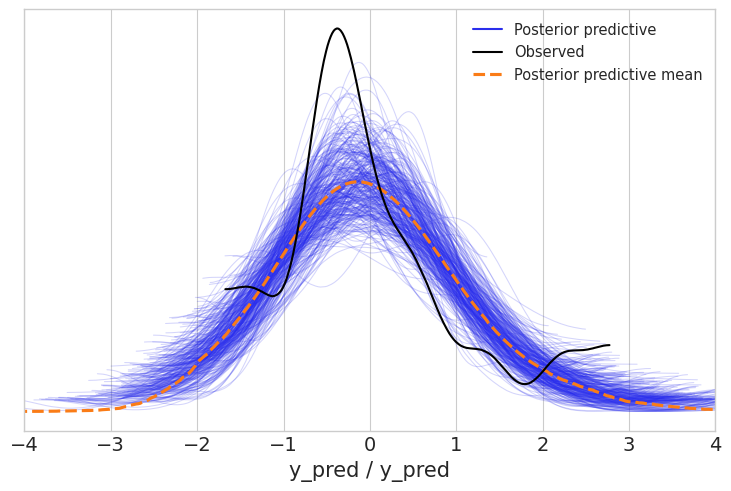

In [49]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [50]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Cubic Regression (with Simple Interactions):")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Cubic Regression (with Simple Interactions):
Avg. LL: -1.08 +- 0.40


In [51]:
# Print MAE
mae = compute_mae(pred_samples, y_data)
print("Cubic Regression (with Simple Interactions):")
print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))

Cubic Regression (with Simple Interactions):
MAE: 4.93 (Tonnes / Ha)


In [52]:
# Save results
results['cubic_si'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': (lo_err_indices, hi_err_indices)
}

### Comparison

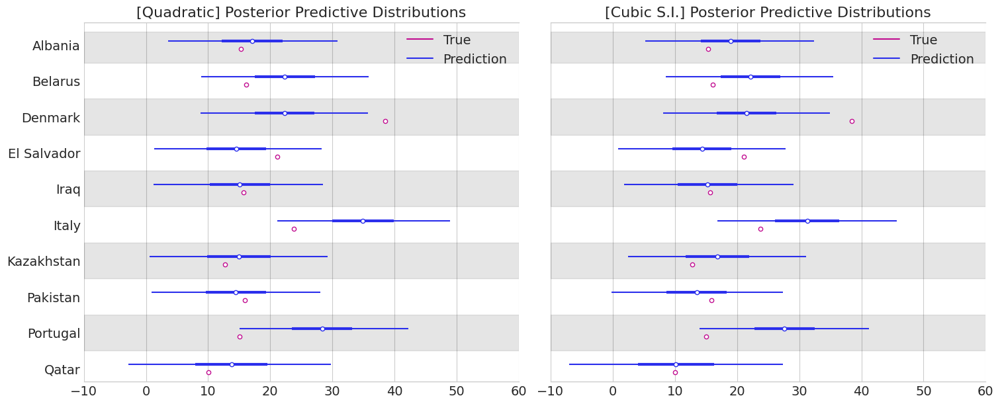

In [53]:
# Plot comparison of predictions
plot_predictions_compare(
    results['quadratic']['pred_samples'], results['cubic_si']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Quadratic] Posterior Predictive Distributions', '[Cubic S.I.] Posterior Predictive Distributions')
)

[]

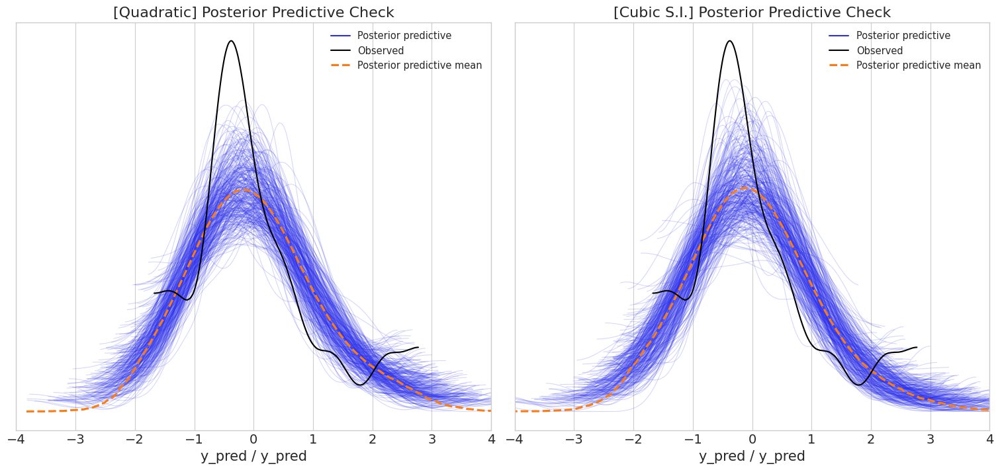

In [54]:
# Posterior predictive check comparison
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
az.plot_ppc(results['quadratic']['ppc_data'], num_pp_samples=320, ax=ax[0])
az.plot_ppc(results['cubic_si']['ppc_data'], num_pp_samples=320, ax=ax[1])
ax[0].set_xlim((-4, 4)); ax[1].set_xlim((-4, 4))
ax[0].set_title('[Quadratic] Posterior Predictive Check'); ax[1].set_title('[Cubic S.I.] Posterior Predictive Check')
plt.plot()

## Removing Outliers (based on Low Pesticides Usage)

The distribution of pesticides usage is really skewed towards a very low usage of them.
We hypothesize that some countries _understimate_ the amount of pesticides used for their crops.
For this reason, we try to remove them from our data, since they can be viewed as outliers.

In [55]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)

# Select Potatoes as item, remove first quartile (based on pesticides), and remove country name feature
cyp = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
filter_indices = cyp['pesticides_kg_per_ha'] > cyp['pesticides_kg_per_ha'].quantile(0.25)
cyp = cyp[filter_indices].reset_index(drop=True)
countries = cyp['Area'].unique()
cyp = cyp.drop('Area', axis=1)

### Features Standardization

In [56]:
# Get the features and the target feature
x_data = cyp.drop('hg/ha_yield', axis=1)
y_data = cyp['hg/ha_yield']
cyp.describe()

,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
count,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000
mean,209207.604397,992.732394,4.171597,15.935264,26.853878,11.358560,590.591549
std,92567.323537,674.342303,4.216158,7.166818,27.552086,57.150321,538.407243
min,75126.304348,51.000000,0.227468,3.459565,-41.000000,-102.000000,28.000000
25%,144101.136646,590.000000,1.170934,9.519824,14.416667,-4.500000,245.500000
50%,182060.304348,703.000000,2.737318,16.376957,33.833333,20.000000,424.000000
75%,245124.804348,1449.500000,6.262172,21.351196,47.166667,35.416667,781.000000
max,448891.538462,3240.000000,20.888427,27.912609,64.000000,174.000000,3186.000000


In [57]:
# Set random seed
np.random.seed(42)

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Set the indices of the samples that will be used for evaluation
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)

### Full Quadratic Regression

In [58]:
# Build design matrix for polynomial regression with grade 2
features = ['pesticides_kg_per_ha', 'avg_temp', 'elev', 'avg_rain_mm_per_year']
p_dataset = design_matrix_polynomial(x_data[features], n=2)

# Standardize the data
p_dataset, p_mean, p_stddev = standardize_data(p_dataset)
p_dataset.describe()

,pesticides_kg_per_ha,avg_temp,elev,avg_rain_mm_per_year,pesticides_kg_per_ha^2,pesticides_kg_per_ha*avg_temp,pesticides_kg_per_ha*elev,pesticides_kg_per_ha*avg_rain_mm_per_year,avg_temp^2,avg_temp*elev,avg_temp*avg_rain_mm_per_year,elev^2,elev*avg_rain_mm_per_year,avg_rain_mm_per_year^2
count,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01,7.100000e+01
mean,1.032038e-16,3.236847e-16,6.723886e-17,6.254778e-17,-4.378344e-17,-1.063312e-16,3.119570e-16,-6.723886e-17,-1.563694e-17,-2.095350e-16,-1.235319e-16,-1.250956e-17,4.436983e-17,-5.316561e-17
std,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00,1.007118e+00
min,-9.421378e-01,-1.753148e+00,-1.052355e+00,-1.406460e+00,-4.842595e-01,-9.074526e-01,-7.220809e-01,-6.596160e-01,-1.225349e+00,-1.145467e+00,-8.990359e-01,-4.682645e-01,-8.856656e-01,-7.748305e-01
25%,-7.167712e-01,-9.015300e-01,-6.455109e-01,-6.014732e-01,-4.659392e-01,-7.548098e-01,-5.976538e-01,-5.859129e-01,-8.959322e-01,-9.167363e-01,-6.834976e-01,-4.240896e-01,-7.330461e-01,-5.877883e-01
50%,-3.426077e-01,6.206891e-02,-3.116178e-01,-4.327099e-01,-3.809379e-01,-4.430943e-01,-3.944823e-01,-4.758454e-01,-1.522988e-01,-2.671675e-01,-4.008038e-01,-3.360244e-01,-3.394526e-01,-5.086904e-01
75%,4.993775e-01,7.610741e-01,3.561685e-01,6.821738e-01,5.952837e-02,4.871873e-01,1.766784e-01,3.385747e-01,6.339531e-01,7.027127e-01,3.314831e-01,-1.793513e-02,1.757886e-01,3.618819e-01
max,3.993165e+00,1.683117e+00,4.854841e+00,3.356252e+00,5.573475e+00,3.706031e+00,5.658560e+00,4.920491e+00,1.987255e+00,2.791475e+00,3.505316e+00,7.030462e+00,3.357214e+00,4.906810e+00


In [59]:
# Build a PyMC3 model for linear regression
model = pymc3_linear_regression_model(p_dataset, y_std_data)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=60_000, tune=30_000, target_accept=0.9,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [eps, beta, alpha]


Sampling 3 chains for 30_000 tune and 60_000 draw iterations (90_000 + 180_000 draws total) took 507 seconds.


[]

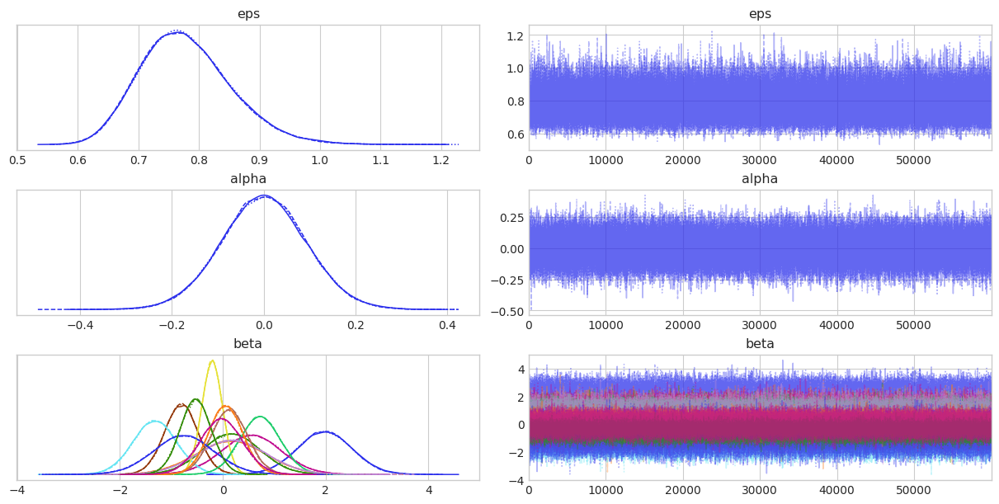

In [60]:
# Plot traces
az.plot_trace(trace, var_names=['eps', 'alpha', 'beta'])
plt.plot()

[]

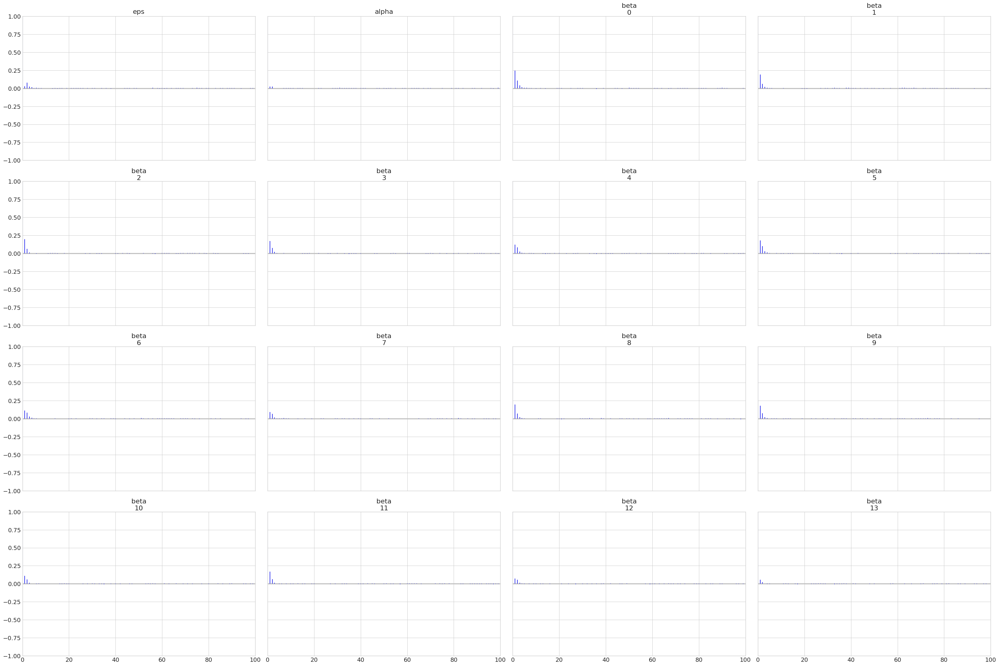

In [61]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['eps', 'alpha', 'beta'], combined=True)
plt.plot()

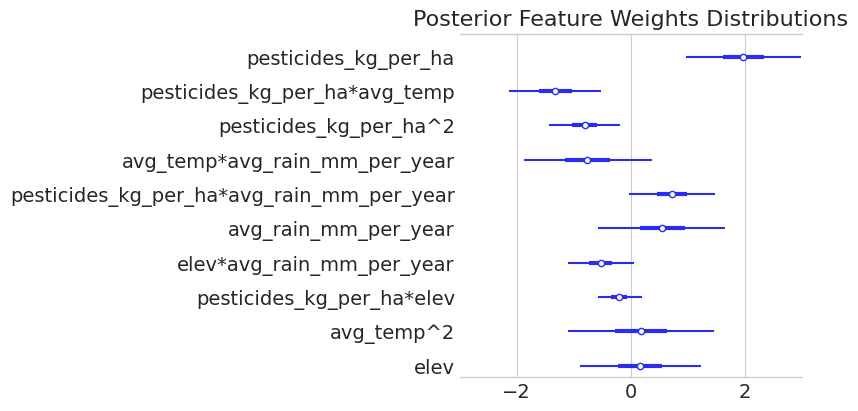

In [62]:
# Plot posterior feature weights distributions
plot_weights_relevance(trace, p_dataset.columns, max_num=10, xlim=(-3, 3))

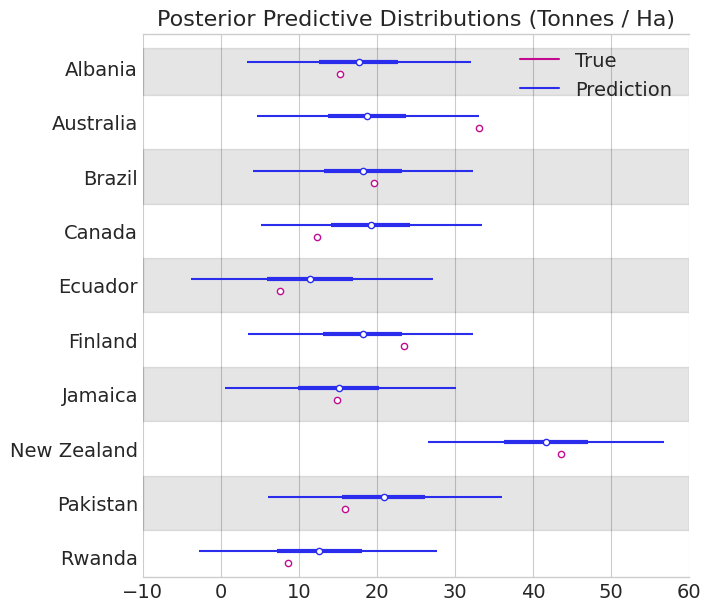

In [63]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

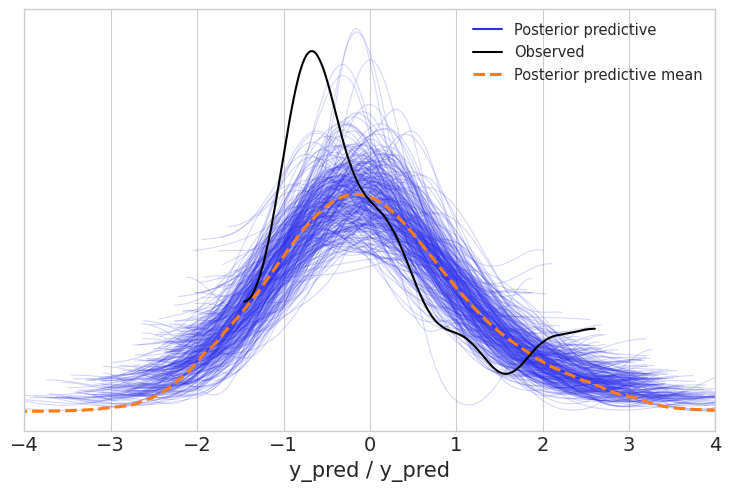

In [64]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [65]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Quadratic Regression without Outliers:")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Quadratic Regression without Outliers:
Avg. LL: -1.16 +- 0.46


In [66]:
# Print MAE
mae = compute_mae(pred_samples, y_data)
print("Quadratic Regression without Outliers:")
print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))

Quadratic Regression without Outliers:
MAE: 4.76 (Tonnes / Ha)


In [67]:
# Save results
results['quadratic_wo'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': (lo_err_indices, hi_err_indices)
}

### Comparison

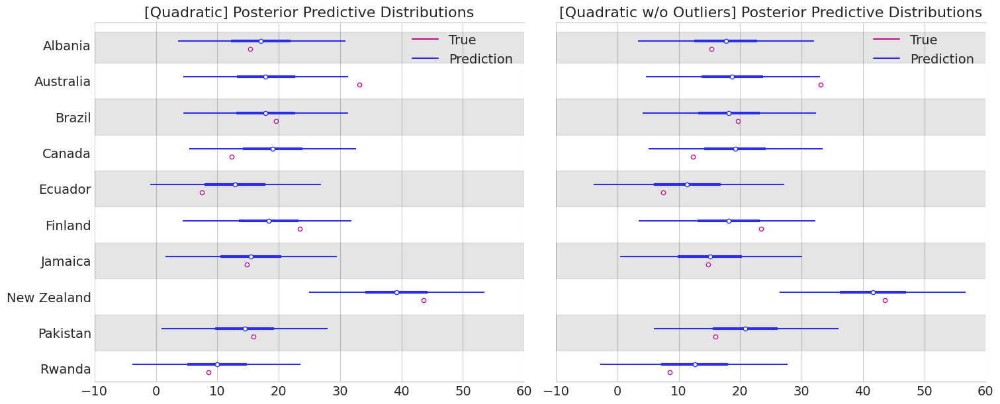

In [68]:
# Plot comparison of predictions
plot_predictions_compare(
    results['quadratic']['pred_samples'][:, filter_indices], results['quadratic_wo']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Quadratic] Posterior Predictive Distributions', '[Quadratic w/o Outliers] Posterior Predictive Distributions')
)

[]

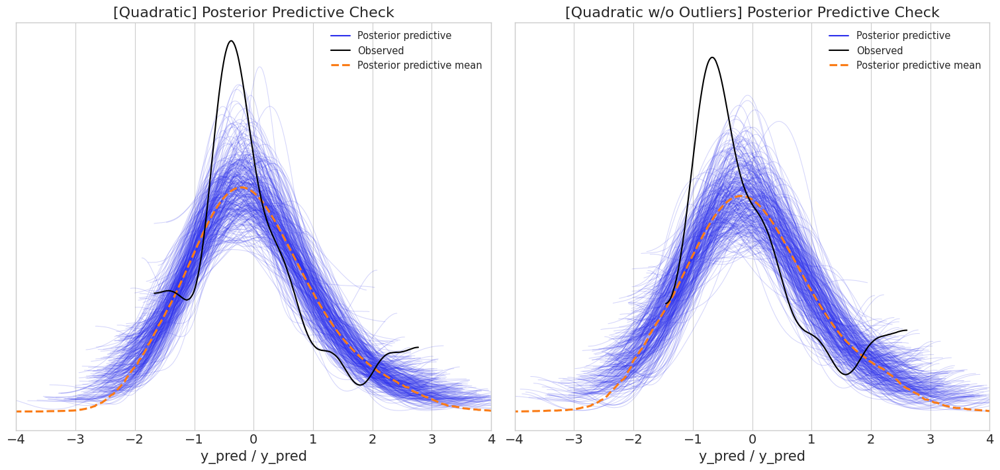

In [69]:
# Posterior predictive check comparison
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
az.plot_ppc(results['quadratic']['ppc_data'], num_pp_samples=320, ax=ax[0])
az.plot_ppc(results['quadratic_wo']['ppc_data'], num_pp_samples=320, ax=ax[1])
ax[0].set_xlim((-4, 4)); ax[1].set_xlim((-4, 4))
ax[0].set_title('[Quadratic] Posterior Predictive Check'); ax[1].set_title('[Quadratic w/o Outliers] Posterior Predictive Check')
plt.plot()

## Regression with Variable Variance

We can suppose that the usage of pesticides in a country is somewhat related to the amount of uncertainty in our models, since we are unsure about the effects of the usage of pesticides in a country precisely for the chosen crop type.

This can be done by modeling the standard deviation $\epsilon$ to be a function of the pesticides usage.

$$\log \epsilon = \gamma + \delta \log (1+P)$$

$$Y \sim \mathrm{Normal}(\mu,\epsilon)$$

where $\gamma$ and $\delta$ are additional non-negative parameters of the model, and $P$ denotes the pesticides usage feature.

In [70]:
def pymc3_linear_regression_variance_model(
    x_data, y_data, v_data,
    alpha_mu=0.0, alpha_sd=5.0,
    beta_mu=0.0, beta_sd=5.0
):
    # Build a PyMC3 linear regression model with variable variance
    with pm.Model() as model:
        # Intercept and slope priors for mu
        alpha = pm.Normal('alpha', mu=alpha_mu, sd=alpha_sd)
        beta = pm.Normal('beta', mu=beta_mu, sd=beta_sd, shape=x_data.shape[1])

        # Intercept and slope priors for eps
        gamma = pm.Normal('gamma', mu=0.0, sd=1.0)
        delta = pm.Normal('delta', mu=0.0, sd=1.0, shape=v_data.shape[1])

        # Likelihood
        mu = pm.Deterministic('mu', alpha + tt.dot(x_data, beta))
        eps = pm.Deterministic('eps', tt.exp(gamma + tt.dot(v_data, delta)))
        y_pred = pm.Normal('y_pred', mu=mu, sd=eps, observed=y_data)
        return model

In [71]:
# Load the dataset
cy = pd.read_csv('data/yield_processed.csv', index_col=0)

# Select Potatoes as item and remove country name feature
cyp = cy[cy['Item'] == 'Potatoes'].drop(columns='Item').reset_index(drop=True)
countries = cyp['Area'].unique()
cyp = cyp.drop('Area', axis=1)

# Get the features and the target feature
x_data = cyp.drop('hg/ha_yield', axis=1)
y_data = cyp['hg/ha_yield']

# Set random seed
np.random.seed(42)

# Standardize the data
x_std_data, x_mean, x_stddev = standardize_data(x_data)
y_std_data, y_mean, y_stddev = standardize_data(y_data)

# Set the indices of the samples that will be used for evaluation
num_test_results = 10
test_indices = np.random.choice(len(y_data), size=num_test_results, replace=False)
test_indices = np.sort(test_indices)
cyp.describe()

,hg/ha_yield,avg_rain_mm_per_year,pesticides_kg_per_ha,avg_temp,lat,lon,elev
count,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000
mean,181841.413334,1019.326316,3.143013,17.850083,21.398688,15.279380,637.568421
std,96668.731420,696.800613,4.049940,7.388661,27.141268,54.357624,586.573509
min,20516.217391,51.000000,0.003028,3.459565,-41.000000,-102.000000,28.000000
25%,127517.738095,577.000000,0.217843,10.646667,2.500000,-3.000000,297.500000
50%,160965.434783,788.000000,1.590888,18.163478,25.000000,20.000000,460.000000
75%,224914.108696,1492.500000,4.085821,24.843652,44.083333,35.416667,826.500000
max,448891.538462,3240.000000,20.888427,29.718696,64.000000,174.000000,3265.000000


In [72]:
# Build design matrix for polynomial regression with grade 2
features = ['pesticides_kg_per_ha', 'avg_temp', 'elev', 'avg_rain_mm_per_year']
p_dataset = design_matrix_polynomial(x_data[features], n=2)

# Standardize the data
p_dataset, p_mean, p_stddev = standardize_data(p_dataset)
p_dataset.describe()

,pesticides_kg_per_ha,avg_temp,elev,avg_rain_mm_per_year,pesticides_kg_per_ha^2,pesticides_kg_per_ha*avg_temp,pesticides_kg_per_ha*elev,pesticides_kg_per_ha*avg_rain_mm_per_year,avg_temp^2,avg_temp*elev,avg_temp*avg_rain_mm_per_year,elev^2,elev*avg_rain_mm_per_year,avg_rain_mm_per_year^2
count,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01
mean,-4.090295e-18,1.110223e-16,-3.856564e-17,-2.571043e-17,-5.901712e-17,-5.843279e-19,1.679943e-16,7.187233e-17,-3.783523e-16,-1.659491e-16,7.713128e-17,1.007966e-17,1.877153e-17,4.440892e-17
std,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00
min,-7.794295e-01,-1.957981e+00,-1.044715e+00,-1.397047e+00,-4.074095e-01,-7.475924e-01,-6.040307e-01,-5.524163e-01,-1.399833e+00,-1.174473e+00,-9.739432e-01,-4.574500e-01,-8.550837e-01,-7.687729e-01
25%,-7.261067e-01,-9.801006e-01,-5.828298e-01,-6.381637e-01,-4.066677e-01,-6.753082e-01,-5.633282e-01,-5.222205e-01,-1.006351e+00,-7.864306e-01,-7.352445e-01,-4.036695e-01,-7.068100e-01,-6.012819e-01
50%,-3.852796e-01,4.264066e-02,-3.043275e-01,-3.337447e-01,-3.679150e-01,-4.538798e-01,-4.182575e-01,-4.369116e-01,-1.658463e-01,-2.304064e-01,-4.156088e-01,-3.282039e-01,-3.231122e-01,-4.553821e-01
75%,2.340307e-01,9.515486e-01,3.238023e-01,6.826686e-01,-1.468989e-01,3.014929e-01,1.543385e-01,1.175884e-01,9.492200e-01,5.917745e-01,4.242161e-01,-3.870694e-02,2.230270e-01,3.589152e-01
max,4.404894e+00,1.614850e+00,4.503051e+00,3.203864e+00,6.401398e+00,4.139688e+00,6.359600e+00,5.588190e+00,1.981553e+00,4.212664e+00,3.218028e+00,6.077591e+00,5.379781e+00,4.550339e+00


In [73]:
# Set the dataset for variable variance
v_dataset = pd.DataFrame({
    'log_pesticides_kg_per_ha': np.log(1.0 + x_data['pesticides_kg_per_ha'])
})
v_dataset, v_mean, v_stddev = standardize_data(v_dataset)
v_dataset.describe()

,log_pesticides_kg_per_ha
count,9.500000e+01
mean,6.310741e-17
std,1.005305e+00
min,-1.265291e+00
25%,-1.031689e+00
50%,-1.227498e-01
75%,6.892689e-01
max,2.446473e+00


In [74]:
# Build a PyMC3 model for linear regression with variable variance
model = pymc3_linear_regression_variance_model(p_dataset, y_std_data, v_dataset)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=60_000, tune=30_000, target_accept=0.95,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [delta, gamma, beta, alpha]


Sampling 3 chains for 30_000 tune and 60_000 draw iterations (90_000 + 180_000 draws total) took 783 seconds.


[]

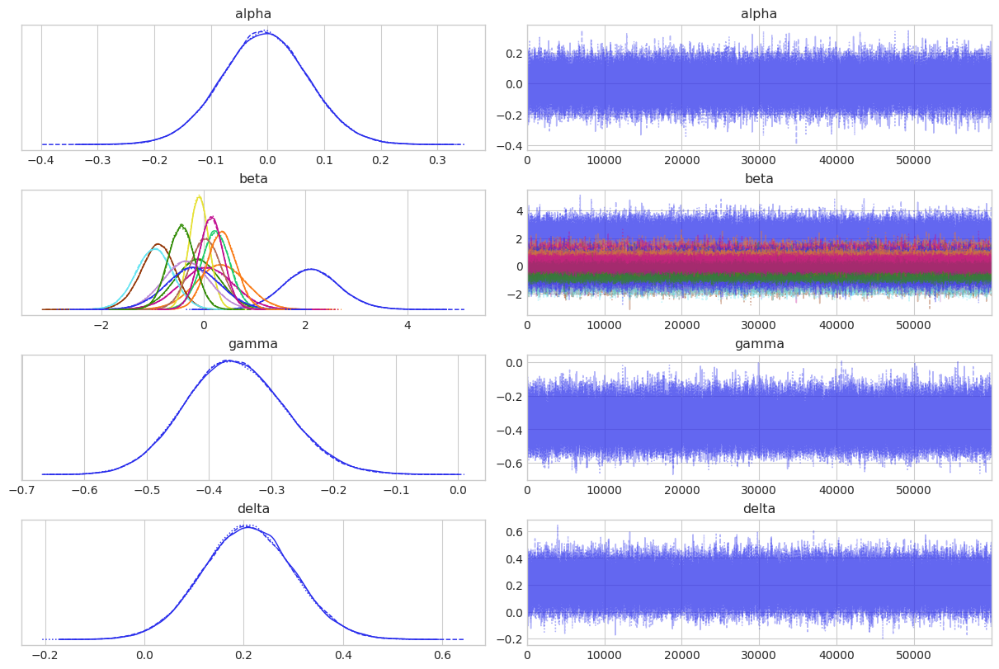

In [75]:
# Plot traces
az.plot_trace(trace, var_names=['alpha', 'beta', 'gamma', 'delta'])
plt.plot()

[]

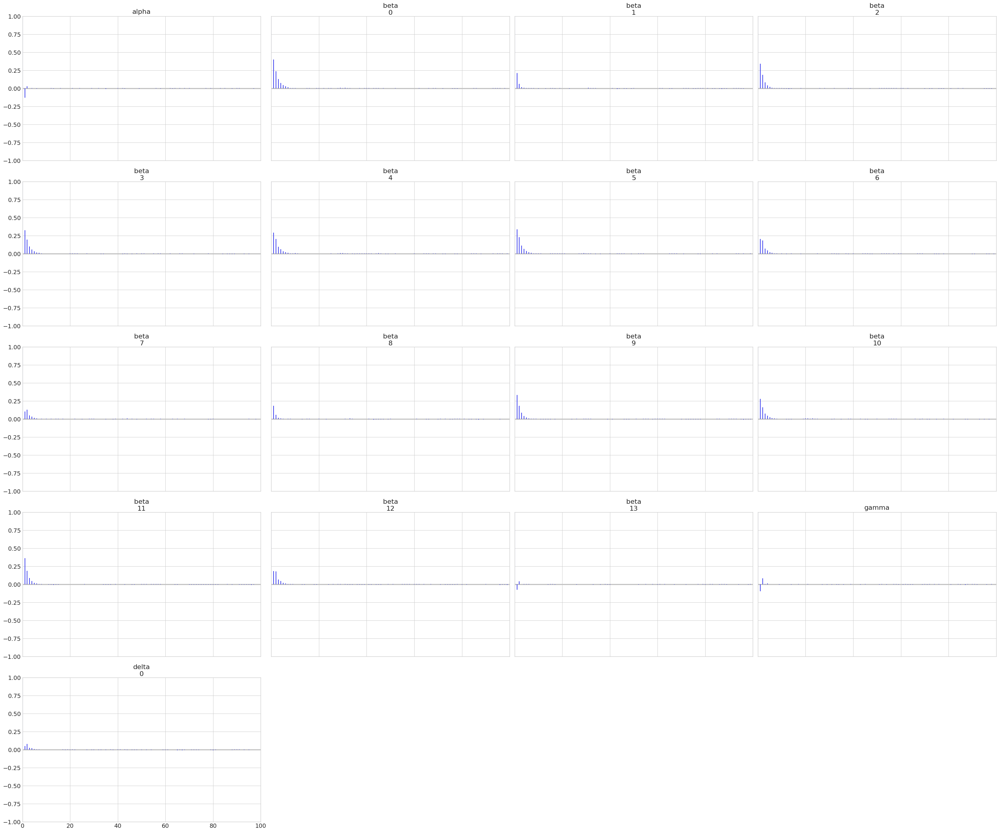

In [76]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['alpha', 'beta', 'gamma', 'delta'], combined=True)
plt.plot()

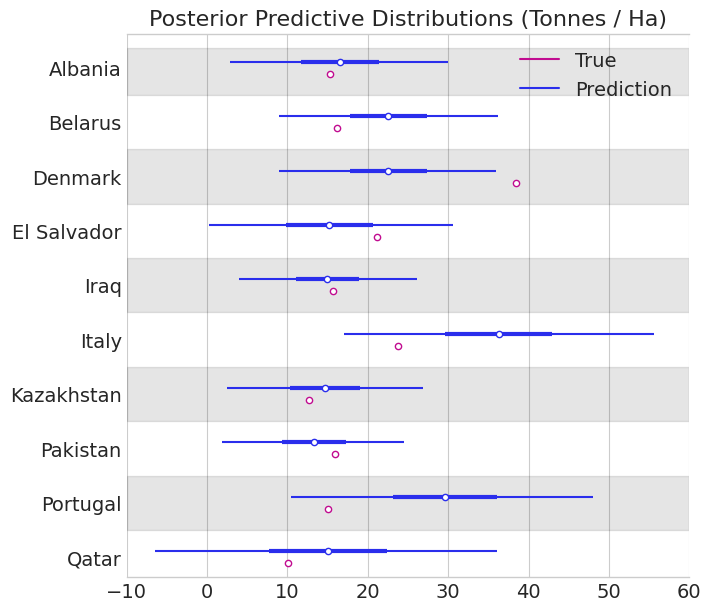

In [77]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

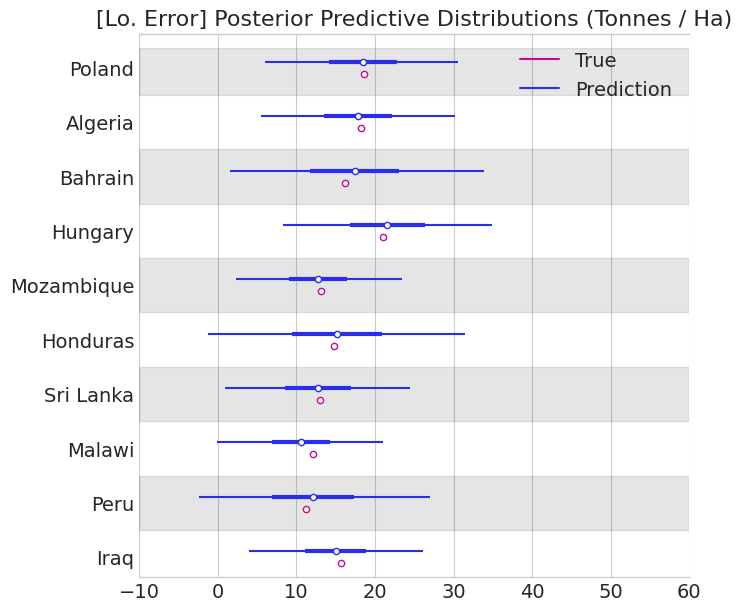

In [78]:
# Plot the predictions of the countries having lowest error
plot_predictions(
    pred_samples, y_data, results['quadratic']['err_indices'][0], sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Lo. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

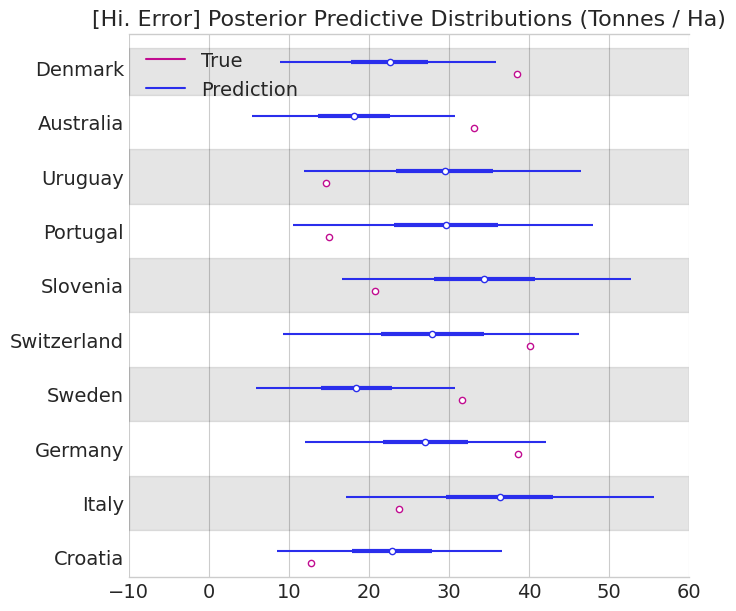

In [79]:
# Plot the predictions of the countries having highest error
plot_predictions(
    pred_samples, y_data, results['quadratic']['err_indices'][1], sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='[Hi. Error] Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

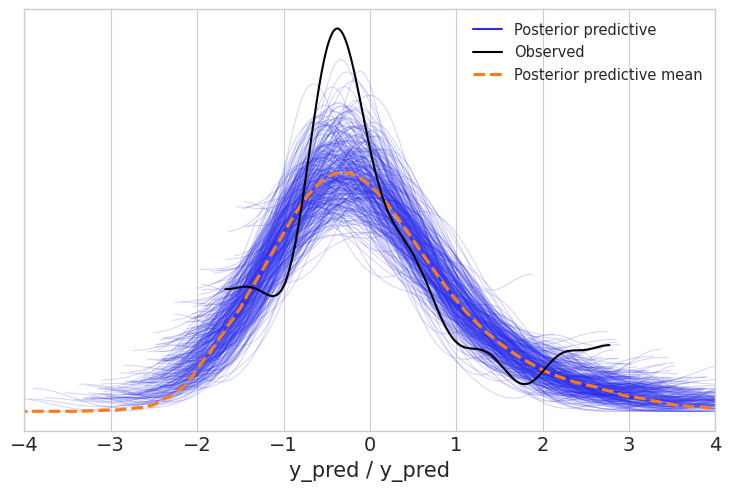

In [80]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [81]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Quadratic Regression with Variable Variance:")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Quadratic Regression with Variable Variance:
Avg. LL: -1.06 +- 0.44


In [82]:
# Print MAE
mae = compute_mae(pred_samples, y_data)
print("Quadratic Regression with Variable Variance:")
print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))

Quadratic Regression with Variable Variance:
MAE: 4.91 (Tonnes / Ha)


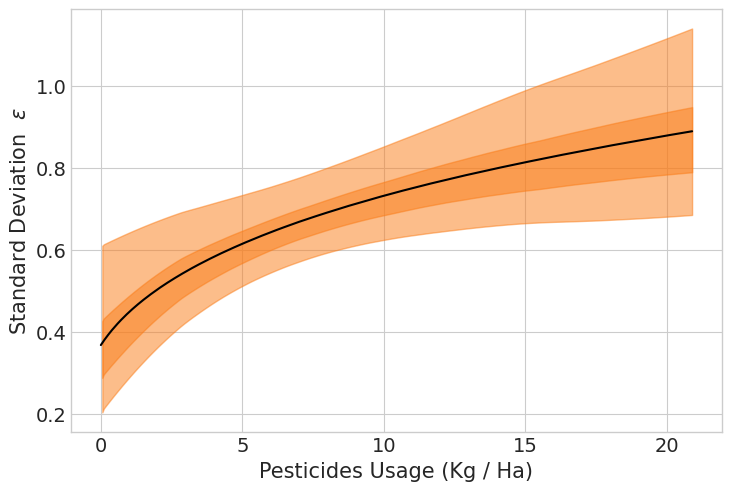

In [83]:
lx = np.linspace(x_data['pesticides_kg_per_ha'].min(), x_data['pesticides_kg_per_ha'].max(), 320)
nlx = np.stack([np.log(1.0 + lx)], axis=1); nlx = (nlx - np.mean(nlx, axis=0)) / np.std(nlx, axis=0)
ly = np.exp(np.expand_dims(trace.posterior['gamma'], axis=2) + np.dot(trace.posterior['delta'], nlx.T))
ax = az.plot_hdi(lx, ly, hdi_prob=0.94)
ax = az.plot_hdi(lx, ly, hdi_prob=0.50)
ax.plot(lx, np.median(ly.reshape(-1, len(lx)), axis=0), c='k')
ax.set_xlabel('Pesticides Usage (Kg / Ha)'); ax.set_ylabel('Standard Deviation  $\epsilon$')
plt.show()

In [84]:
# Save results
results['quadratic_vv'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': results['quadratic']['err_indices']
}

### Comparison

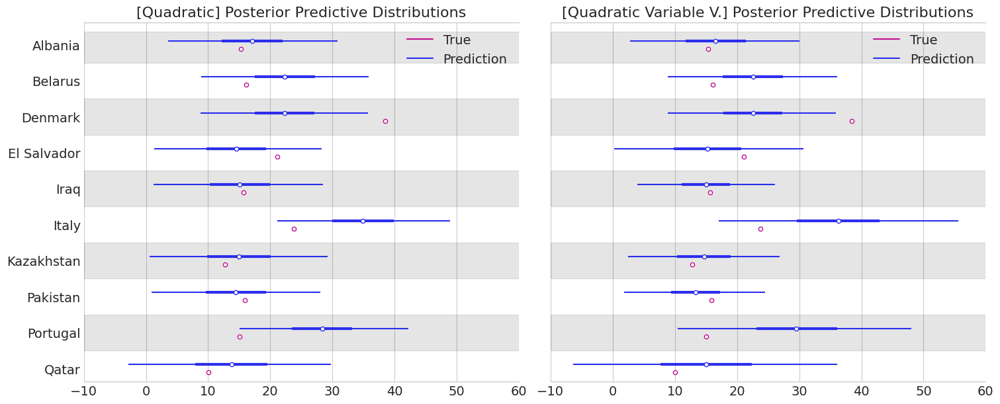

In [85]:
# Plot comparison of predictions
plot_predictions_compare(
    results['quadratic']['pred_samples'], results['quadratic_vv']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Quadratic] Posterior Predictive Distributions', '[Quadratic Variable V.] Posterior Predictive Distributions')
)

[]

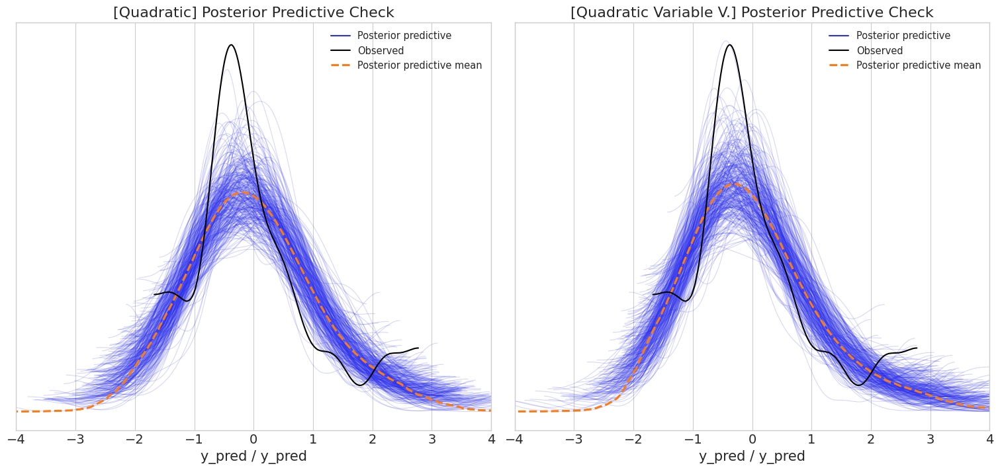

In [87]:
# Posterior predictive check comparison
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
az.plot_ppc(results['quadratic']['ppc_data'], num_pp_samples=320, ax=ax[0])
az.plot_ppc(results['quadratic_vv']['ppc_data'], num_pp_samples=320, ax=ax[1])
ax[0].set_xlim((-4, 4)); ax[1].set_xlim((-4, 4))
ax[0].set_title('[Quadratic] Posterior Predictive Check'); ax[1].set_title('[Quadratic Variable V.] Posterior Predictive Check')
plt.plot()

# Linear Splines

In [88]:
def design_matrix_linear_spline(df, knots, knots_selection='uniform'):
    assert knots_selection in ['quantiles', 'uniform']

    # Initialize knots
    if isinstance(knots, int):
        n_knots = knots
        assert n_knots > 0
        if knots_selection == 'quantiles':
            qs = np.arange(1, n_knots + 1) / (n_knots + 1)
            knots = df.quantile(qs).reset_index(drop=True)
            knots = {knots.columns[i]: q for i, q in enumerate(knots.to_numpy().T)}
        elif knots_selection == 'uniform':
            knots = {
                h: np.histogram_bin_edges(df[h], bins=n_knots + 1)[1:-1]
                for h in df.columns
            }
    else:
        ls = [len(v) for v in knots.values()]
        assert len(set(ls)) == 1
        n_knots = ls[0]

    spl_df = dict()
    for h in df.columns:
        # Compute max(x-c_i, 0.0) for each knot c_i
        x_knots = np.asarray(knots[h])
        x = df[h].to_numpy()[:, np.newaxis]
        x = np.maximum(x - x_knots, 0.0)

        # Add features
        headers = ['{}[{}]'.format(h, i + 1) for i in range(n_knots)]
        for i, h in enumerate(headers):
            spl_df[h] = x[:, i]

    # Return the resulting dataframe
    return pd.concat([df, pd.DataFrame(spl_df)], axis=1), knots

We define the method `design_matrix_linear_spline` that computes the corresponding linear spline design matrix, given the number of knots and the method for initializing knots.

In [89]:
df = pd.DataFrame({'X': [0.3, 0.5, -1.0, 0.2, 0.8], 'Y': [0.5, 1.0, 1.0, 0.5, 0.3]})
display(df)
spl_df, knots = design_matrix_linear_spline(df, knots=2, knots_selection='uniform')
display(pd.DataFrame(knots))
display(spl_df.round(4))

,X,Y
0,0.3,0.5
1,0.5,1.0
2,-1.0,1.0
3,0.2,0.5
4,0.8,0.3


,X,Y
0,-0.4,0.533333
1,0.2,0.766667


,X,Y,X[1],X[2],Y[1],Y[2]
0,0.3,0.5,0.7,0.1,0.0000,0.0000
1,0.5,1.0,0.9,0.3,0.4667,0.2333
2,-1.0,1.0,0.0,0.0,0.4667,0.2333
3,0.2,0.5,0.6,0.0,0.0000,0.0000
4,0.8,0.3,1.2,0.6,0.0000,0.0000


In [90]:
# Build design matrix for linear spline regression with 5 knots selected uniformly
features = ['pesticides_kg_per_ha', 'avg_temp', 'elev', 'avg_rain_mm_per_year']
s_dataset, knots = design_matrix_linear_spline(x_data[features], knots=5, knots_selection='uniform')

# Standardize the data
s_dataset, s_mean, s_stddev = standardize_data(s_dataset)
s_dataset.describe()

,pesticides_kg_per_ha,avg_temp,elev,avg_rain_mm_per_year,pesticides_kg_per_ha[1],pesticides_kg_per_ha[2],pesticides_kg_per_ha[3],pesticides_kg_per_ha[4],pesticides_kg_per_ha[5],avg_temp[1],...,elev[1],elev[2],elev[3],elev[4],elev[5],avg_rain_mm_per_year[1],avg_rain_mm_per_year[2],avg_rain_mm_per_year[3],avg_rain_mm_per_year[4],avg_rain_mm_per_year[5]
count,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,...,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01,9.500000e+01
mean,-4.090295e-18,1.110223e-16,-3.856564e-17,-2.571043e-17,1.752984e-17,-1.285521e-17,5.901712e-17,-1.227089e-17,-1.285521e-17,2.518453e-16,...,-1.869849e-17,-5.258951e-18,1.227089e-17,-2.746341e-17,2.921640e-18,2.337312e-17,2.571043e-17,-3.739699e-17,5.258951e-18,-1.636118e-17
std,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,...,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00,1.005305e+00
min,-7.794295e-01,-1.957981e+00,-1.044715e+00,-1.397047e+00,-4.380567e-01,-2.811136e-01,-2.019610e-01,-1.508991e-01,-1.130835e-01,-1.434063e+00,...,-4.805409e-01,-2.648108e-01,-1.826929e-01,-1.465391e-01,-1.461819e-01,-8.256833e-01,-5.450609e-01,-3.168845e-01,-2.109891e-01,-1.458807e-01
25%,-7.261067e-01,-9.801006e-01,-5.828298e-01,-6.381637e-01,-4.380567e-01,-2.811136e-01,-2.019610e-01,-1.508991e-01,-1.130835e-01,-1.037965e+00,...,-4.805409e-01,-2.648108e-01,-1.826929e-01,-1.465391e-01,-1.461819e-01,-8.204209e-01,-5.450609e-01,-3.168845e-01,-2.109891e-01,-1.458807e-01
50%,-3.852796e-01,4.264066e-02,-3.043275e-01,-3.337447e-01,-4.380567e-01,-2.811136e-01,-2.019610e-01,-1.508991e-01,-1.130835e-01,2.138784e-02,...,-4.805409e-01,-2.648108e-01,-1.826929e-01,-1.465391e-01,-1.461819e-01,-4.929369e-01,-5.450609e-01,-3.168845e-01,-2.109891e-01,-1.458807e-01
75%,2.340307e-01,9.515486e-01,3.238023e-01,6.826686e-01,-2.441936e-01,-2.811136e-01,-2.019610e-01,-1.508991e-01,-1.130835e-01,9.628320e-01,...,5.506231e-02,-2.648108e-01,-1.826929e-01,-1.465391e-01,-1.461819e-01,6.477924e-01,3.091505e-01,-3.168845e-01,-2.109891e-01,-1.458807e-01
max,4.404894e+00,1.614850e+00,4.503051e+00,3.203864e+00,5.167739e+00,6.217766e+00,7.276556e+00,8.438451e+00,9.646409e+00,1.649877e+00,...,5.097797e+00,6.062563e+00,6.766078e+00,7.078564e+00,7.346005e+00,3.477352e+00,4.252967e+00,5.325630e+00,6.361106e+00,7.487157e+00


In [91]:
# Build a PyMC3 model for linear spline regression
model = pymc3_linear_regression_model(s_dataset, y_std_data)

# Sample from the posterior
with model:
    trace = pm.sample(
        draws=50_000, tune=25_000, target_accept=0.9,
        chains=3, cores=3, random_seed=42,
        return_inferencedata=True
    )

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [eps, beta, alpha]


Sampling 3 chains for 25_000 tune and 50_000 draw iterations (75_000 + 150_000 draws total) took 1203 seconds.


[]

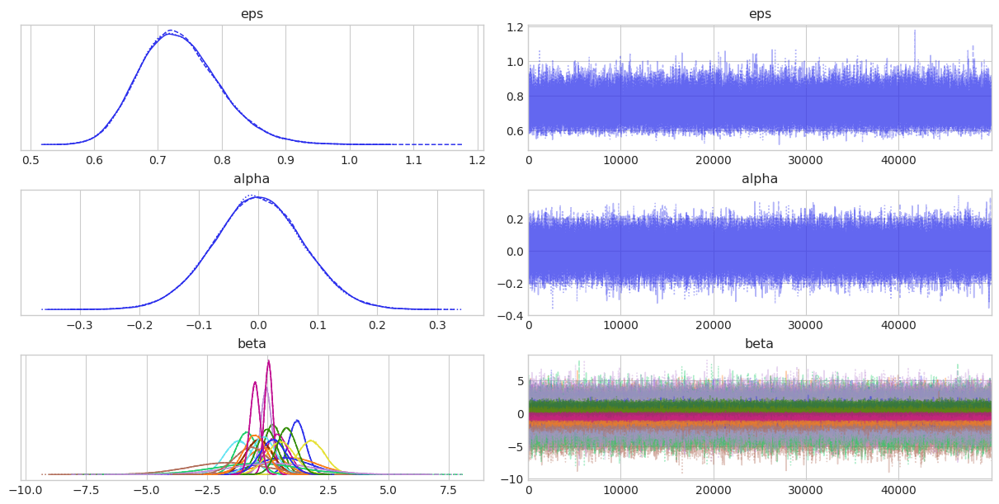

In [92]:
# Plot traces
az.plot_trace(trace, var_names=['eps', 'alpha', 'beta'])
plt.plot()

[]

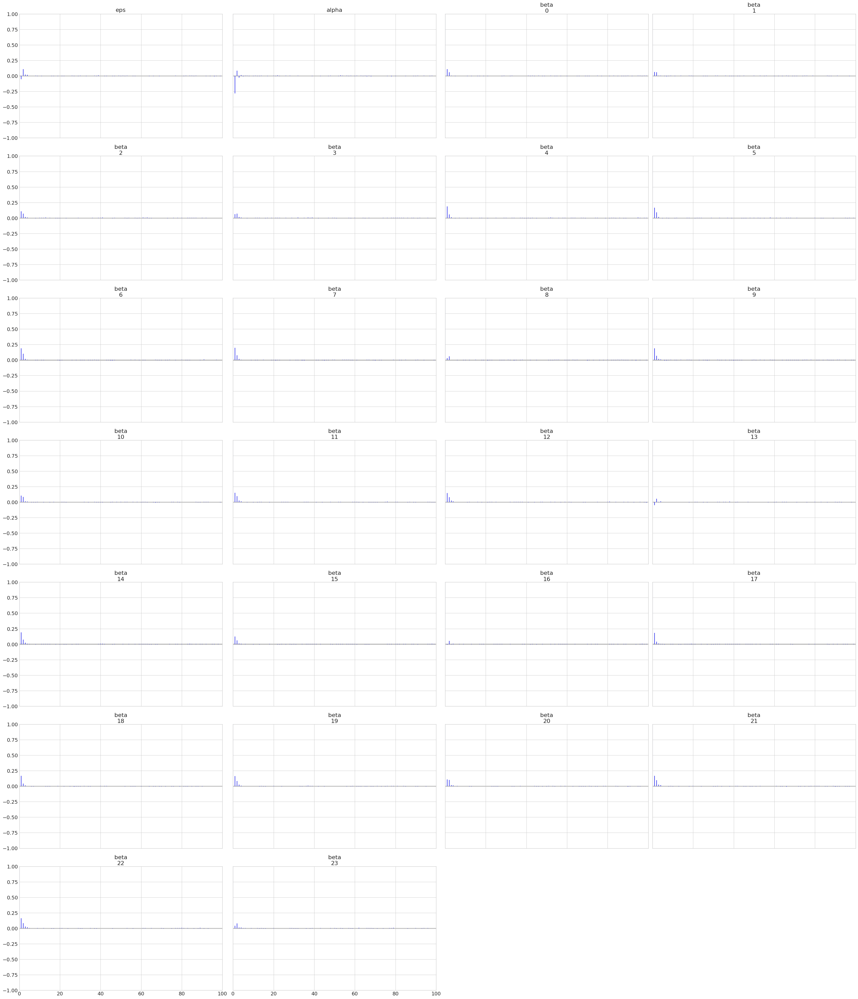

In [93]:
# Plot auto-correlation plots
az.plot_autocorr(trace, var_names=['eps', 'alpha', 'beta'], combined=True)
plt.plot()

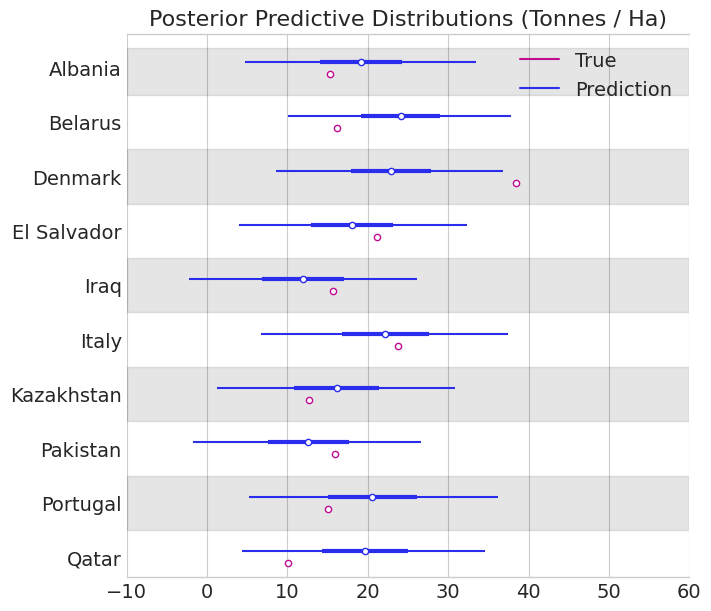

In [94]:
# Sample the predictions and plot them
ppc, pred_samples = pymc3_sample_predictions(model, trace)
pred_samples = y_stddev * pred_samples + y_mean
plot_predictions(
    pred_samples, y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), title='Posterior Predictive Distributions (Tonnes / Ha)'
)

[]

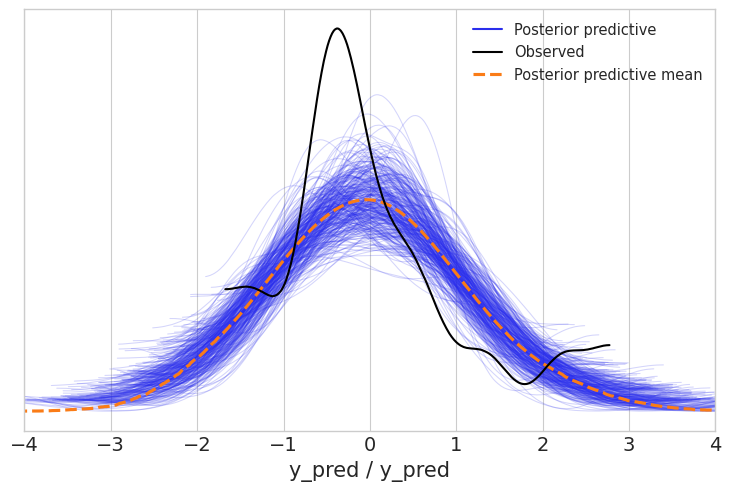

In [95]:
# Posterior predictive check
ppc_data = az.from_pymc3(posterior_predictive=ppc, model=model)
ax = az.plot_ppc(ppc_data, num_pp_samples=320)
ax.set_xlim((-4, 4))
plt.plot()

In [96]:
# Print the average log-likelihood
mu_ll, sigma_ll = compute_average_ll(trace)
print("Multivariate Linear Spline Regression:")
print("Avg. LL: {:.2f} +- {:.2f}".format(mu_ll, sigma_ll))

Multivariate Linear Spline Regression:
Avg. LL: -1.10 +- 0.54


In [97]:
# Print MAE
mae = compute_mae(pred_samples, y_data); print("Multivariate Linear Spline Regression:"); print("MAE: {:.2f} (Tonnes / Ha)".format(mae * 1e-4))
print("Linear Regression:"); print("MAE: {:.2f} (Tonnes / Ha)".format(results['linear']['metrics']['mae'] * 1e-4))

Multivariate Linear Spline Regression:
MAE: 4.84 (Tonnes / Ha)
Linear Regression:
MAE: 5.76 (Tonnes / Ha)


In [98]:
# Save results
results['linear_spline'] = {
    'metrics': {'ll': (mu_ll, sigma_ll), 'mae': mae},
    'ppc_data': ppc_data,
    'pred_samples': pred_samples,
    'err_indices': results['linear']['err_indices']
}

### Comparison

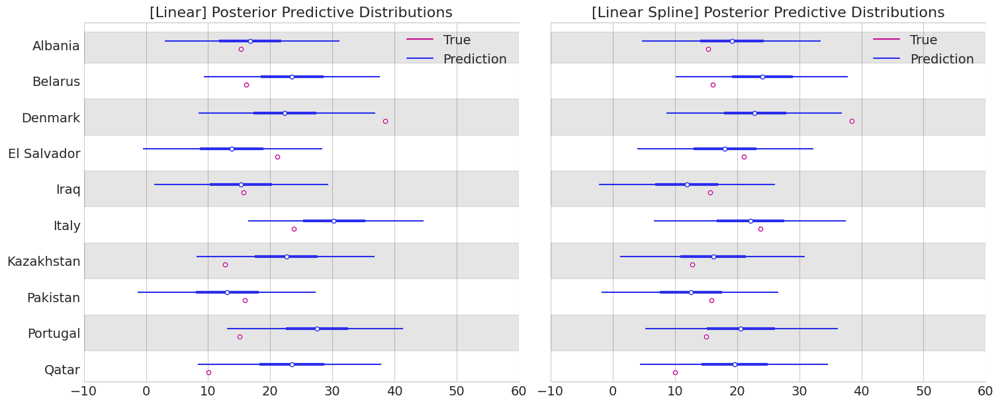

In [99]:
# Plot comparison of predictions
plot_predictions_compare(
    results['linear']['pred_samples'], results['linear_spline']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Linear] Posterior Predictive Distributions', '[Linear Spline] Posterior Predictive Distributions')
)

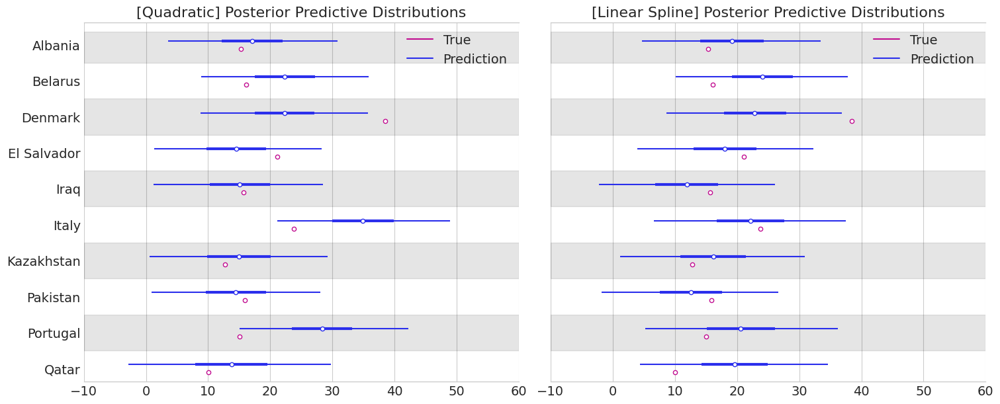

In [100]:
# Plot comparison of predictions
plot_predictions_compare(
    results['quadratic']['pred_samples'], results['linear_spline']['pred_samples'], y_data, test_indices, sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Quadratic] Posterior Predictive Distributions', '[Linear Spline] Posterior Predictive Distributions')
)

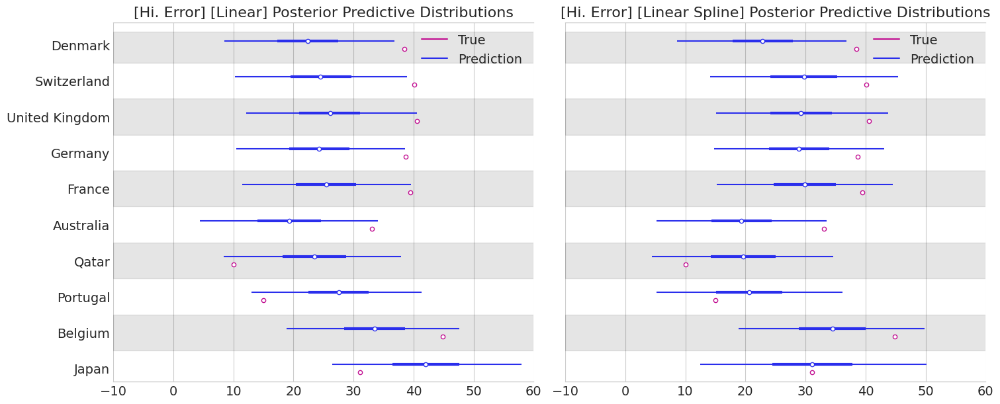

In [101]:
# Plot comparison of predictions
plot_predictions_compare(
    results['linear']['pred_samples'], results['linear_spline']['pred_samples'], y_data, results['linear']['err_indices'][1], sample_ids=countries, transform=lambda x: 1e-4 * x,
    xlim=(-10, 60), titles=('[Hi. Error] [Linear] Posterior Predictive Distributions', '[Hi. Error] [Linear Spline] Posterior Predictive Distributions')
)

[]

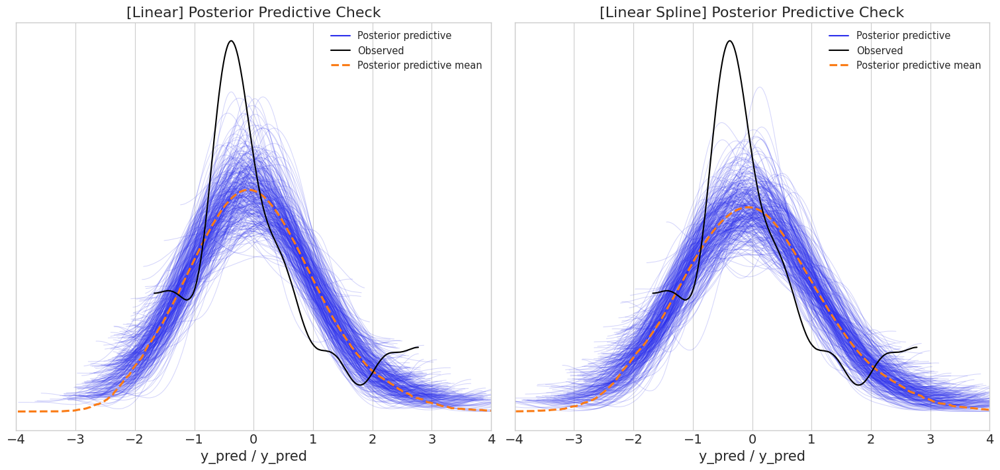

In [102]:
# Posterior predictive check comparison
fig, ax = plt.subplots(1, 2, figsize=(15, 7), sharex=True, sharey=True)
az.plot_ppc(results['linear']['ppc_data'], num_pp_samples=320, ax=ax[0])
az.plot_ppc(results['linear_spline']['ppc_data'], num_pp_samples=320, ax=ax[1])
ax[0].set_xlim((-4, 4)); ax[1].set_xlim((-4, 4))
ax[0].set_title('[Linear] Posterior Predictive Check'); ax[1].set_title('[Linear Spline] Posterior Predictive Check')
plt.plot()

# Conclusion

- Polynomial models are more accurate than a linear model;

- The usage of pesticides play a major role in the predictions, but it is also involved in uncertainty;

- Linear splines can model non-linearities, but they are computationally heavy to sample from;

- Posterior Predictive Checks (PPC) are useful for evaluating Bayesian models.

In [103]:
# Save results to (compressed) file
with gzip.open('yields-regression-results.pickle.gz', 'wb') as f:
    f.write(pickle.dumps(results))

In [104]:
# Load the results from (compressed) file
with gzip.open('yields-regression-results.pickle.gz', 'rb') as f:
    results = pickle.loads(f.read())

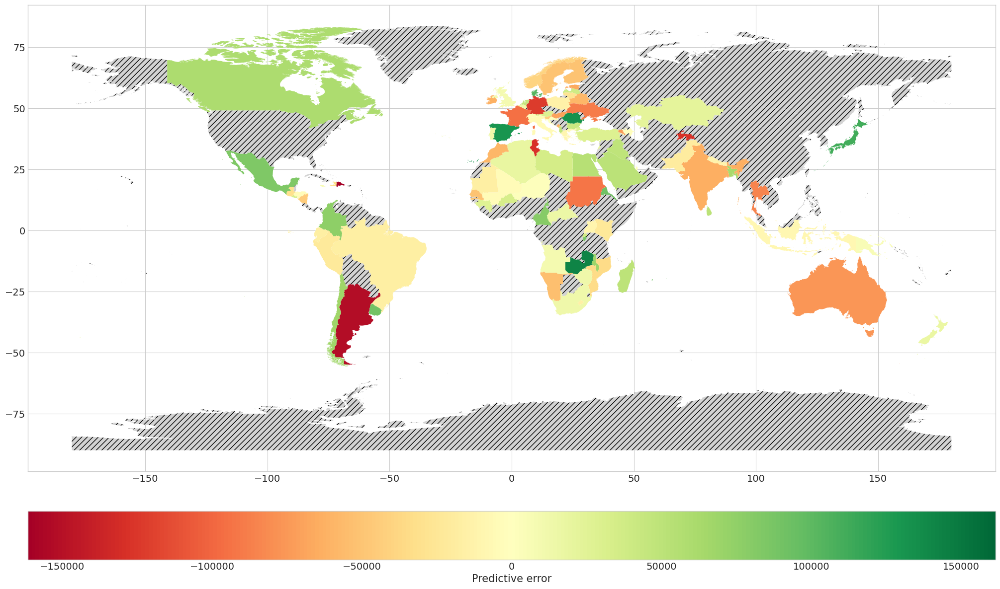

In [105]:
# Plot the errors of the best model on the world graph
world = get_geodata(countries)
y_pred = np.asarray(results['quadratic']['ppc_data']['posterior_predictive']['y_pred'])
y_pred = np.squeeze(y_pred, axis=0)
world_error_plot(world, y_pred, y_mean, y_stddev, y_data.to_numpy())
plt.savefig('images/classic-errmap.png', dpi=192)